## Projected Changed in the Hydrological Cycle

Authors: **Jacklyn Bihl** (tuq41877@temple.edu) & **Lucas DeVito** (tuq23846@temple.edu)

The goal of this notebook is to answer the question **'Is it true that "<span style="color:blue">wet gets wetter**, **and** **<span style="color:red">dry gets drier** **"?'** This question is in relation to climate change, asking that as climate change has more adverse effects on our planet, will humid areas receive higher levels of precipitation, and arid areas receive lower levels of precipitation? 

Data from the Coupled Model Intercomparison Project (CMIP6) can be analyzed to model future changes in the hydrologic cycle with the increase of CO2 emissions. For this analysis, we will be looking at the following datasets:
- **Monthly sea surface salinity** (sos)
- **Monthly precipitation** (pr)
- **Monthly water vapor content** (prw)
- **Monthly evaporation rates** (evspsbl)
- **Monthly snowfall flux** (prs)

For each dataset, we'll be looking at two *climate scenarios*, the **SSP1-26** and **SSP5-85** models, which represent opposite ends of the emission spectrum.
- The **SSP5-85** scenario involves the heavy reliance on fossil fuels in the future, and is often termed the 'business as usual' approach, where we make no effort to save the environment or our planet as a whole.
- We will also analyze **SSP1-26**, which is a carbon emissions scenario where there is less concentration on economic growth and instead focuses on reducing emissions and creating a more sustainable society.

*For more information on climate scenarios and how they differ, click [here](https://www.dkrz.de/en/communication/climate-simulations/cmip6-en/the-ssp-scenarios) to be redirected to an in-depth article on the topic.*

The CMIP6 data stored in the Google Cloud Storage are derived from the original CMIP6 data files distributed via the Earth System Grid Federation ([ESGF](https://aims2.llnl.gov/search/cmip6/)). The CMIP6 hosted on Google Cloud are maintained by the Climate Data Science Lab at Lamont Doherty Earth Observatory (LDEO) of Columbia University, as part of the Pangeo Project.

Before moving forward with our analysis, we'll need to import any necessary packages and import both climate scenarios for each dataset:

In [115]:
# Importing necessary packages
from matplotlib import pyplot as plt
import numpy as np
import pandas as pd
import xarray as xr
import zarr  # to read in Zarr format
import gcsfs # to read google cloud data
import cftime
import cmocean
import cartopy.crs as ccrs
import wocemaps

In [116]:
# Setting figure parameters
xr.set_options(display_style='html')
%matplotlib inline                           
%config InlineBackend.figure_format='retina' 
plt.rcParams['figure.figsize'] = 12,6  

In [117]:
# Used to import data
google_cloud_cmip6 = pd.read_csv('https://storage.googleapis.com/cmip6/cmip6-zarr-consolidated-stores.csv')

In [118]:
# This only needs to be created once per Jupyter session
gcs = gcsfs.GCSFileSystem(token='anon')

**Monthly Sea Surface Salinity (sos) Datasets**

In [119]:
# Code to import Sea Surface Salinity data for the SSP126 Scenario
sos_data = google_cloud_cmip6.query(
    "activity_id=='ScenarioMIP' & \
    table_id == 'Omon' & \
    variable_id == 'sos' & \
    experiment_id == 'ssp126' & \
    institution_id == 'NOAA-GFDL' &  \
    source_id == 'GFDL-ESM4' & \
    grid_label == 'gr' & \
    member_id == 'r1i1p1f1'"
)

sos_zarr = sos_data.zstore.values[-1]

# create a mutable-mapping-style interface to the store
mapper_sos = gcs.get_mapper(sos_zarr)
# open the dataset using xarray and zarr
gfdl_esm4_sos_126 = xr.open_zarr(mapper_sos, 
                                consolidated=True,use_cftime=True).sos.rename({'lat':'latitude',
                                                             'lon':'longitude'})

In [120]:
# Code to import Sea Surface Salinity data for the SSP585 Scenario
sos_ssp585_data = google_cloud_cmip6.query(
    "activity_id=='ScenarioMIP' & \
    table_id == 'Omon' & \
    variable_id == 'sos' & \
    experiment_id == 'ssp585' & \
    institution_id == 'NOAA-GFDL' &  \
    source_id == 'GFDL-ESM4' & \
    grid_label == 'gr' & \
    member_id == 'r1i1p1f1'"
)
sos_585_zarr = sos_data.zstore.values[-1]
# create a mutable-mapping-style interface to the store
mapper_585_sos = gcs.get_mapper(sos_585_zarr)
# open the dataset using xarray and zarr
gfdl_esm4_585_sos = xr.open_zarr(mapper_585_sos, 
                                consolidated=True,use_cftime=True).sos.rename({'lat':'latitude',
                                                             'lon':'longitude'})

**Monthly Precipitation (pr) Datasets**

In [121]:
# Code to import Precipitation data for the SSP126 Scenario
pr126_import = google_cloud_cmip6.query(
    "activity_id=='ScenarioMIP' & \
    table_id == 'Amon' & \
    variable_id == 'pr' & \
    experiment_id == 'ssp126' & \
    institution_id == 'NOAA-GFDL' &  \
    source_id == 'GFDL-ESM4' & \
    grid_label == 'gr1' & \
    member_id == 'r1i1p1f1'"
)

pr126_zarr = pr126_import.zstore.values[-1]

# create a mutable-mapping-style interface to the store
pr126_mapper = gcs.get_mapper(pr126_zarr)
# open the dataset using xarray and zarr
pr126 = xr.open_zarr(pr126_mapper, 
                                consolidated=True,use_cftime=True).pr.rename({'lat':'latitude',
                                                             'lon':'longitude'})

In [122]:
# Code to import Precipitation data for the SSP585 Scenario
pr585_import = google_cloud_cmip6.query(
    "activity_id=='ScenarioMIP' & \
    table_id == 'Amon' & \
    variable_id == 'pr' & \
    experiment_id == 'ssp585' & \
    institution_id == 'NOAA-GFDL' &  \
    source_id == 'GFDL-ESM4' & \
    grid_label == 'gr1' & \
    member_id == 'r1i1p1f1'"
)

pr585_zarr = pr585_import.zstore.values[-1]

# create a mutable-mapping-style interface to the store
pr585_mapper = gcs.get_mapper(pr585_zarr)
# open the dataset using xarray and zarr
pr585 = xr.open_zarr(pr585_mapper, 
                                consolidated=True,use_cftime=True).pr.rename({'lat':'latitude',
                                                             'lon':'longitude'})

**Monthly Water Vapor Content (prw) Datasets**

In [123]:
# Code to import Water Vapor Content data for the SSP126 Scenario
wv_ssp126_data = google_cloud_cmip6.query(
    "activity_id=='ScenarioMIP' & \
    table_id == 'Amon' & \
    variable_id == 'prw' & \
    experiment_id == 'ssp126' & \
    institution_id == 'NOAA-GFDL' &  \
    source_id == 'GFDL-ESM4' & \
    grid_label == 'gr1' & \
    member_id == 'r1i1p1f1'"
)
wv_126_zarr = wv_ssp126_data.zstore.values[-1]
# create a mutable-mapping-style interface to the store
mapper_126_wv = gcs.get_mapper(wv_126_zarr)
# open the dataset using xarray and zarr
gfdl_esm4_126_wv = xr.open_zarr(mapper_126_wv, 
                                consolidated=True,use_cftime=True).prw.rename({'lat':'latitude',
                                                             'lon':'longitude'})

In [124]:
# Code to import Water Vapor Content data for the SSP585 Scenario
prw585_import = google_cloud_cmip6.query(
    "activity_id=='ScenarioMIP' & \
    table_id == 'Amon' & \
    variable_id == 'prw' & \
    experiment_id == 'ssp585' & \
    institution_id == 'NOAA-GFDL' &  \
    source_id == 'GFDL-ESM4' & \
    grid_label == 'gr1' & \
    member_id == 'r1i1p1f1'"
)

prw585_zarr = prw585_import.zstore.values[-1]

# create a mutable-mapping-style interface to the store
prw585_mapper = gcs.get_mapper(prw585_zarr)
# open the dataset using xarray and zarr
prw585 = xr.open_zarr(prw585_mapper, 
                                consolidated=True,use_cftime=True).prw.rename({'lat':'latitude',
                                                             'lon':'longitude'})

**Monthly “evaporation including sublimination and transpiration” (evspsbl) Datasets**

In [125]:
# Code to import Evaporation data for the SSP126 Scenario
evap_ssp126_data = google_cloud_cmip6.query(
    "activity_id=='ScenarioMIP' & \
    table_id == 'Amon' & \
    variable_id == 'evspsbl' & \
    experiment_id == 'ssp126' & \
    institution_id == 'NOAA-GFDL' &  \
    source_id == 'GFDL-ESM4' & \
    grid_label == 'gr1' & \
    member_id == 'r1i1p1f1'"
)
evap_126_zarr = evap_ssp126_data.zstore.values[-1]
# create a mutable-mapping-style interface to the store
mapper_126_evap = gcs.get_mapper(evap_126_zarr)
# open the dataset using xarray and zarr
gfdl_esm4_126_evap = xr.open_zarr(mapper_126_evap, 
                                consolidated=True,use_cftime=True).evspsbl.rename({'lat':'latitude',
                                                             'lon':'longitude'})

In [126]:
# Code to import Evaporation data for the SSP585 Scenario
evap_ssp585_data = google_cloud_cmip6.query(
    "activity_id=='ScenarioMIP' & \
    table_id == 'Amon' & \
    variable_id == 'evspsbl' & \
    experiment_id == 'ssp585' & \
    institution_id == 'NOAA-GFDL' &  \
    source_id == 'GFDL-ESM4' & \
    grid_label == 'gr1' & \
    member_id == 'r1i1p1f1'"
)
evap_585_zarr = evap_ssp585_data.zstore.values[-1]
# create a mutable-mapping-style interface to the store
mapper_585_evap = gcs.get_mapper(evap_585_zarr)
# open the dataset using xarray and zarr
gfdl_esm4_585_evap = xr.open_zarr(mapper_585_evap, 
                                consolidated=True,use_cftime=True).evspsbl.rename({'lat':'latitude',
                                                             'lon':'longitude'})

**Monthly Snow Fall Flux (prs) Datasets**

In [127]:
# Code to import Snow Fall Flux data for the SSP126 Scenario
prs126_import = google_cloud_cmip6.query(
    "activity_id=='ScenarioMIP' & \
    table_id == 'Amon' & \
    variable_id == 'prsn' & \
    experiment_id == 'ssp126' & \
    institution_id == 'NOAA-GFDL' &  \
    source_id == 'GFDL-ESM4' & \
    grid_label == 'gr1' & \
    member_id == 'r1i1p1f1'"
)

prs126_zarr = prs126_import.zstore.values[-1]

# create a mutable-mapping-style interface to the store
prs126_mapper = gcs.get_mapper(prs126_zarr)
# open the dataset using xarray and zarr
prs126 = xr.open_zarr(prs126_mapper, 
                                consolidated=True,use_cftime=True).prsn.rename({'lat':'latitude',
                                                             'lon':'longitude'})

In [128]:
# Code to import Snow Fall Flux data for the SSP585 Scenario
prs585_import = google_cloud_cmip6.query(
    "activity_id=='ScenarioMIP' & \
    table_id == 'Amon' & \
    variable_id == 'prsn' & \
    experiment_id == 'ssp585' & \
    institution_id == 'NOAA-GFDL' &  \
    source_id == 'GFDL-ESM4' & \
    grid_label == 'gr1' & \
    member_id == 'r1i1p1f1'"
)

prs585_zarr = prs585_import.zstore.values[-1]

# create a mutable-mapping-style interface to the store
prs585_mapper = gcs.get_mapper(prs585_zarr)
# open the dataset using xarray and zarr
prs585 = xr.open_zarr(prs585_mapper, 
                                consolidated=True,use_cftime=True).prsn.rename({'lat':'latitude',
                                                             'lon':'longitude'})

### Variable Explanations

Before we begin discussing the content of each dataset, let's first discuss what each variable means and what it's measuring:

- **Precipitation**: The volume of precipitation (in kg) per m² per second.

- **Snowfall Flux**: The measurement of how much snow (measured in kg) passes through a unit area (in this case, m²) within a given time (in this case, seconds).

- **Salinity**: The amount of dissolved salts in water, measured in grams of salt per 1000 grams of water, defined as one practical salinity unit (PSU).

- **Evaporation**: What occurs when a liquid turns into a gas. It is measured in (kg/m²s), which is kilograms per meters squared per second.

- **Water Vapor Content**: The amount of water vapor present per unit area (kg per m²). This could also be referred to at the 'humidity' in a given area.
d.

Now that we've established the goal of this project, loaded in our datasets, and explained what each variable means, let's take a look at how to visualize these datasets!

### Precipitation

The first dataset we'll take a look at is **precipitation**, where we'll calculate the *climatological average* of the first and last twenty years. If you recall, the *climatological average* is important in data analysis because it provides us with baseline conditions to compare our findings to. Because this is a draft, both the first and last averages will be mapped, but since they're essentially conveying the same points, only the first *climatological average* will be mapped in the final notebook.

Below is the *climatological average* for the **precipitation** dataset:

In [129]:
# SSP1-26 Code

# Creating a climatological average (2015-3035)
# First, select the appropriate time frame (2015-2035)
first20yr_pr126 = pr126.sel(time = slice('2015-01-16', '2035-01-16'))
# Then, calculate the global mean of each gridcell through time
firstavg_pr126 = first20yr_pr126.mean('time')

# Creating a climatological average (2080-2100)
# This is done using the same technique described above.
last20yr_pr126 = pr126.sel(time = slice('2080-12-16', '2100-12-16'))
lastavg_pr126 = last20yr_pr126.mean('time')

# Creating a dataset that calculates the anomaly between the first and last twenty years
# This is done by simply finding the difference between the last and first climatological average
pr126_anomaly = lastavg_pr126 - firstavg_pr126

In [130]:
# SSP5-85 Code

# Creating a climatological average (2015-3035)
# First, select the appropriate time frame (2015-2035)
first20yr_pr585 = pr585.sel(time = slice('2015-01-16', '2035-01-16'))
# Then, calculate the global mean of each gridcell through time
firstavg_pr585 = first20yr_pr585.mean('time')

# Creating a climatological average (2080-2100)
# This is done using the same technique described above.
last20yr_pr585 = pr585.sel(time = slice('2080-12-16', '2100-12-16'))
lastavg_pr585 = last20yr_pr585.mean('time')

# Creating a dataset that calculates the anomaly between the first and last twenty years
# This is done by simply finding the difference between the last and first climatological average
pr585_anomaly = lastavg_pr585 - firstavg_pr585

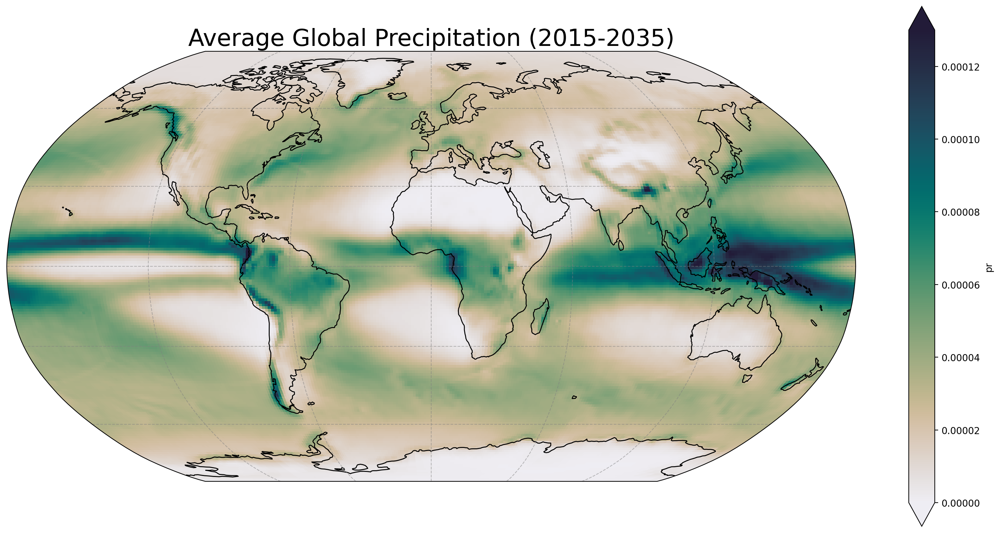

In [131]:
# Establishing figure parameters and ensuring coastlines can be added atop the maps
subplot_kws=dict(projection=ccrs.Robinson())
fig, ax = plt.subplots(figsize = (16, 8), subplot_kw = subplot_kws)

# Plotting each dataset on their perspective axis
firstavg_pr126.plot(cmap = cmocean.cm.rain, vmin = 0, vmax = 0.00013, transform = ccrs.PlateCarree(), extend = 'both')

#Setting figure titles
ax.set_title('Average Global Precipitation (2015-2035)', fontsize = 25)

# Adding coastlines for better visualization
ax.coastlines()

# For nicer spacing
plt.tight_layout()

# Adding gridlines
ax.gridlines(color='grey', alpha=0.5, linestyle='--')

**Figure 1.** Global map depicting the climatological average for precipitation across a set timeframe (2015-2035).

When looking at the global precipitation map, we can see some common trends across latitudes, such as the fact that the equator sees the most precipitation, and the poles see the least amount of precipitation. The rudimentary explanation for this is simply that areas near the equator are warmer, resulting in elevated levels of evaporation, causing more precipitation as a result. What this doesn't answer, however, is why there's areas of low precipitation immediately after leaving the equator around 25N and 25S. **What could cause this?**

After doing a bit of research, the primary causes of these dry areas could be do to global wind currents, with three primary circulations being present in both the Northern and Southern hemisphere. The picture below visualizes all three circulations (cells) on either side of the equator, the number 1 on the picture showing **Hadley cells**, number 2 showing **Ferrel cells**, and number 3 showing **Polar cells**. Something important to note about these cells are the high or low pressure bands that forms between each cell, with a high pressure zone being created around a latitude of 30, and the low pressure zones around the equator and at a latitude of 50-60 (*Global Atmospheric Circulations*). **Why are these high and low pressure systems important?**

Well, when discussing climate, **high pressure zones** are typically hotter and more arid, while **low pressure zones** tend to have frequent precipitation events (*Global Atmospheric Circulations*). Because of this, we see areas of higher precipitation near the equator, as well as around a latitude of 50-60 and see areas of lower precipitation around a latitude of 25 and near the poles. This would explain the band of low precipitation seen both at a latitude of 25 as well as near the poles!

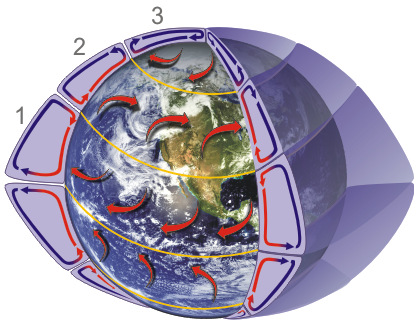

This image was taken from an article on NOAA's website titled *Global Atmospheric Circulations*. A full citation is available in the references.

Next, we'll take a look at the **precipitation anomalies** seen in each scenario. This is where calculating the *climatological average* of the last 20 years of each dataset will come in handy. The code for the calculation of the anomalies for both scenarios are available just before each global map, simply subtracting the last 20 year average by the first 20 year average.

**What does the anomaly of a given variable tell us?**

Taking a look at anomalies for any variable can be crucial to understanding how global conditions have changed over the given time period. This is a lot more helpful than looking at the individual *climatological average* maps and trying to figure out the differences that way!

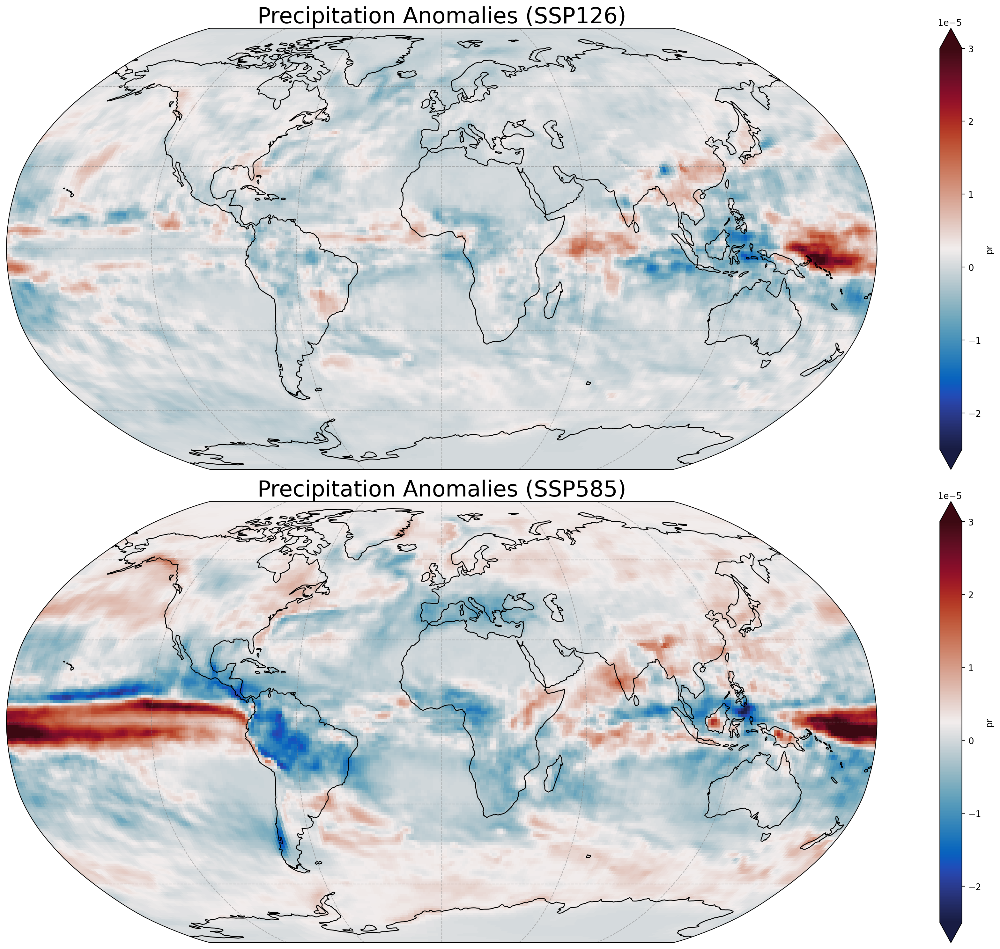

In [132]:
# Establishing figure parameters and ensuring coastlines can be added atop the maps
subplot_kws=dict(projection=ccrs.Robinson())
fig, (ax1, ax2) = plt.subplots(ncols = 1, nrows = 2, figsize = (20, 15), subplot_kw = subplot_kws)

# Plotting each dataset on their perspective axis
pr126_anomaly.plot(ax = ax1, cmap = cmocean.cm.balance, vmin = -0.000025, vmax = 0.00003, transform = ccrs.PlateCarree(), extend = 'both')
pr585_anomaly.plot(ax = ax2, cmap = cmocean.cm.balance, vmin = -0.000025, vmax = 0.00003, transform = ccrs.PlateCarree(), extend = 'both')

#Setting figure titles
ax1.set_title('Precipitation Anomalies (SSP126)', fontsize = 25)
ax2.set_title('Precipitation Anomalies (SSP585)', fontsize = 25)

# Adding coastlines for better visualization
ax1.coastlines()
ax2.coastlines()

# For nicer spacing
plt.tight_layout()

# Adding gridlines
ax1.gridlines(color='grey', alpha=0.5, linestyle='--')
ax2.gridlines(color='grey', alpha=0.5, linestyle='--')

**Figure 2.** Precipitation anomalies relative to a 2015-2035 baseline. The top map shows precipitation anomalies for the SSP1-26 scenario, and the bottom shows anomalies for the SSP5-85 scenario.

When comparing precipitation anomalies amongst the **SSP1-26** and **SSP5-85** scenarios, a clear difference in patterns can be seen.

The **SSP1-26** scenario features less extreme anomalies, with only the Western Pacific Ocean having an extreme change in precipitation.

The **SSP5-85** scenario, however, features extreme anomalies in both directions, with the equatorial Pacific Ocean getting much wetter, while areas directly above and below get drier (to varying extents). The 'wetter' areas (the equator and around a latitude of 50-60 in either direction) do seem to get wetter, and the 'drier' areas (the poles and around a latitude of 25-30 in either direction) seem to either get drier, or remain somewhat constant (with the highest anomaly being around 0.5).

While looking at the anomalies can yield useful information, looking at latitudinal data can provide useful information as to how conditions have changed across multiple zones (equator, poles, etc.).

First we'll take a look at **Latitudinal Cross Sections of Precipitation** in both the **SSP1-26** and **SSP5-85** scenarios.

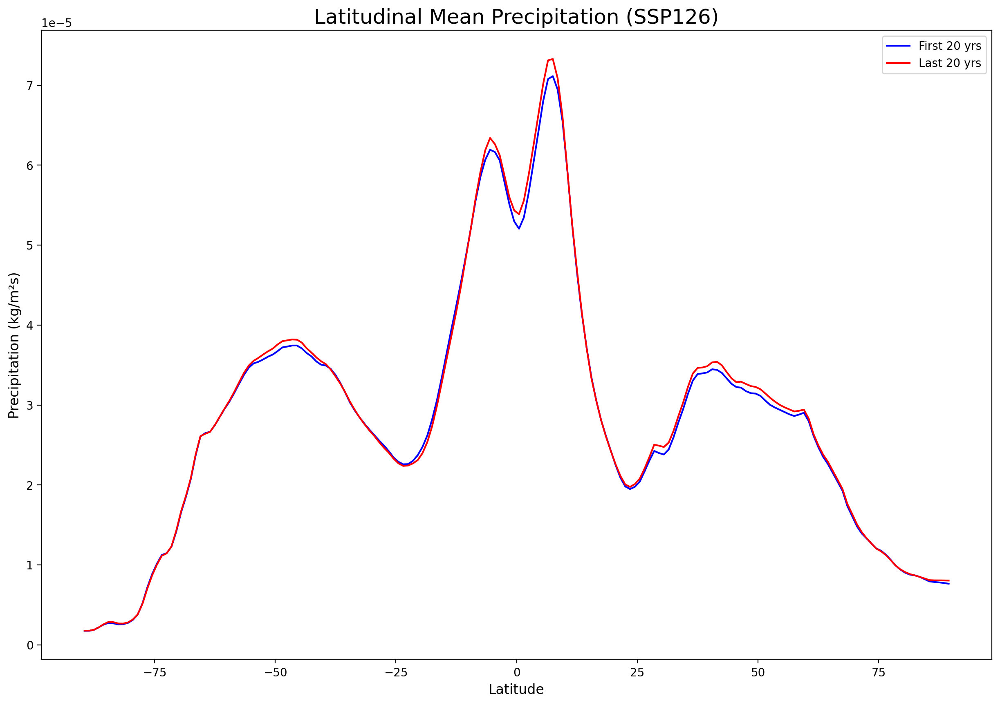

In [133]:
# Establishing figure parameters
fig, ax = plt.subplots(figsize = (15, 10))

# Assigning each dataset to the appropriate axis
# The code below finds the mean precipitation across global latitude, which can then be plotted on a graph to observe latitudinal changes in precipitation
firstavg_pr126.mean(dim = 'longitude').plot(color = 'blue', label = 'First 20 yrs')
lastavg_pr126.mean(dim = 'longitude').plot(color = 'red', label = 'Last 20 yrs')

# Adding figure titles
ax.set_title('Latitudinal Mean Precipitation (SSP126)', fontsize = 18)

# Adding axis titles/legends
ax.set_ylabel('Precipitation (kg/m²s)', fontsize = 12)
ax.set_xlabel('Latitude', fontsize = 12)
ax.legend()

**Figure 3.** Latitudinal cross section of mean precipitation across two timeframes in the SSP1-26 scenario. The blue line represents the first twenty years (2015-2035) of the dataset, and the red line represents the last twenty years (2080-2100).

Here, we can see that the latitudinal mean precipitation between the first and last twenty years of the dataset are virtually the same, with the lines following the same trends and overlapping in most areas. This will mostly be the case when analyzing the **SSP1-26** scenario, as this is the pathway focused on sustainability and severly reducing global emissions. 

It is important to note, however, that 'wet' areas (around the equator and 50N and S) do get *slightly wetter*, while the 'dry' areas (around 25N and S and the poles) have almost *identical* precipitation rates in the first and last twenty years.

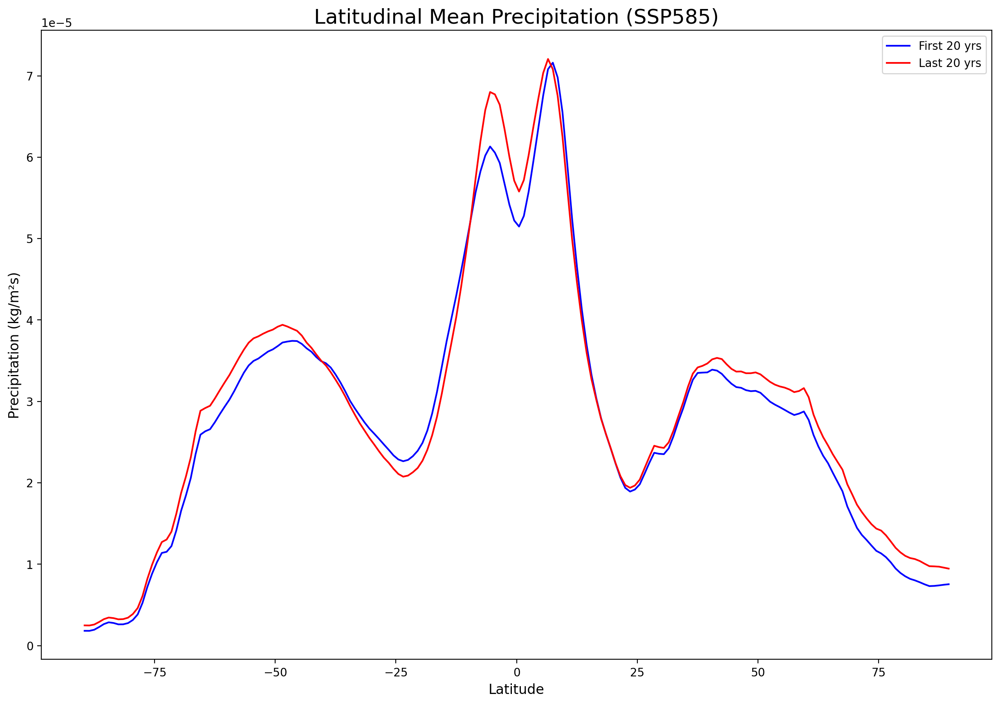

In [134]:
# Establishing figure parameters
fig, ax = plt.subplots(figsize = (15, 10))

# Assigning each dataset to the appropriate axis
# The code below finds the mean precipitation across global latitude, which can then be plotted on a graph to observe latitudinal changes in precipitation
firstavg_pr585.mean(dim = 'longitude').plot(color = 'blue', label = 'First 20 yrs')
lastavg_pr585.mean(dim = 'longitude').plot(color = 'red', label = 'Last 20 yrs')

# Adding figure titles
ax.set_title('Latitudinal Mean Precipitation (SSP585)', fontsize = 18)

# Adding axis titles/legends
ax.set_ylabel('Precipitation (kg/m²s)', fontsize = 12)
ax.set_xlabel('Latitude', fontsize = 12)
ax.legend()

**Figure 4.** Latitudinal cross section of mean precipitation across two timeframes in the SSP5-85 scenario. The blue line represents the first twenty years (2015-2035) of the dataset, and the red line represents the last twenty years (2080-2100).

Looking at a latitudinal cross section of the first and last twenty years in the **SSP5-85** scenario, we can see that there are some notable differences at almost every point along the curve. Precipitation rates are being altered at a slightly faster rate in the Southern Hemisphere, however, due to a larger volume of water present. This is particularly relevant to take into consideration when looking at 25N and 25S, as the dry region around 25S shows a significant decrease in precipitation, while 25N precipitation rates remain relatively the same.

It is imoprtant to note that aside from 25S, all other regions are either experiencing the same or slightly elevated levels of precipitation, with rates around 50N, 50S, and just below the equator showing larger increases.

**What would be causing these elevated levels of precipitation?**

Well, global increases in precipitation as global temperatures also increase is no coincidence -- just like seeing precipitation being impacted to a larger degree in the Southern Hemisphere (an area with less land and more ocean) is no coincidence. 

As global temperatures rise and more incident radiation is absorbed, it's important to take the oceans into consideration. An article written by NASA states that upwards of 90% of excess heat resulting from global warming is absorbed into our oceans (*The Ocean and Climate Change*). These warmer ocean temperatures lead to elevated rates of evaporation, which in turn, will also result in elevated rates of precipitation. 

Areas that are more ocean-dominated, like in the Southern Hemisphere, will feel more of an impact in precipitation rates due to a higher water availability. This is why, in the latitudinal cross section above, we can see more noticable differences in precipitation in the Southern Hemisphere.

For the last part of my analysis of the precipitation dataset, I want to **compare differences in global mean precipitation rates in the SSP1-26 and SSP5-85 scenarios.**

Because Earth is a sphere, each gridcell won't have the same area within it. To account for this in a global mean calculation, we will first need to use code from Dr. Beadling, which applies the appropriate gridcell weights to each cell across the globe:

In [135]:
# Code from Dr. Beadling:

# The following function is used to create weights for the Earths grid space.
import warnings 

def standard_grid_cell_area(latitude, longitude, rE=6371.0e3):
    """ computes the cell area for a standard spherical grid """

    dLat = latitude[1] - latitude[0]
    dLon = longitude[1] - longitude[0]
    area = np.empty((len(latitude), len(longitude)))
    for j in range(0, len(latitude)):
        for i in range(0, len(longitude)):
            lon1 = longitude[i] + dLon / 2
            lon0 = longitude[i] - dLon / 2
            lat1 = latitude[j] + dLat / 2
            lat0 = latitude[j] - dLat / 2
            area[j, i] = (
                (np.pi / 180.0)
                * rE
                * rE
                * np.abs(np.sin(np.radians(lat0)) - np.sin(np.radians(lat1)))
                * np.abs(lon0 - lon1)
            )
    return area

lat_sst = pr126.coords['latitude'].values #1-D numpy array of model's latitude values
lon_sst = pr126.coords['longitude'].values #1-D numpy array of model's longitude values

# make sure to replace the name of the data array if you chose a 
# different name and use the appropriate coordinate names within the ['']
# based on the coordinates of lat / lon in your dataset.

# Pass the arrays to the standard_grid_cell_area function
areacell = standard_grid_cell_area(lat_sst,lon_sst)  

# The areacella_xarray function outputs a numpy array. Convert this back into 
# and xarray DataArray for further use. If this is a field you will be using 
# often. You may wish to save this newly created DataArray as a Dataset and save 
# as a netcdf file.

# here we assign dimensions and coordinates that are the same as our original SST array:

areacell_xarray = xr.DataArray(areacell,dims=({'latitude':180, 'longitude':360}),\
                                                coords=(pr126.coords['latitude'],\
                                                        pr126.coords['longitude']))

In [136]:
# Placing the weighted cells atop our already created dataset using the .weighted() function
# Then, using the .mean() function over latitude and longitude will produce a dataset showing mean global averages through time
weighted_pr126 = pr126.weighted(areacell_xarray).mean(['latitude', 'longitude']) 
weighted_pr585 = pr585.weighted(areacell_xarray).mean(['latitude', 'longitude']) 

In [137]:
# Calculating global mean precipitation by using weighted datasets, grouping by year, and getting a mean value for each year
mean_pr126 = weighted_pr126.groupby('time.year').mean(dim = 'time')
mean_pr585 = weighted_pr585.groupby('time.year').mean(dim = 'time')

Now that we have weighted datasets and the annual mean precipitation for each scenario (you can consult the above code and markdown for further information), we can create a figure to compare the two.

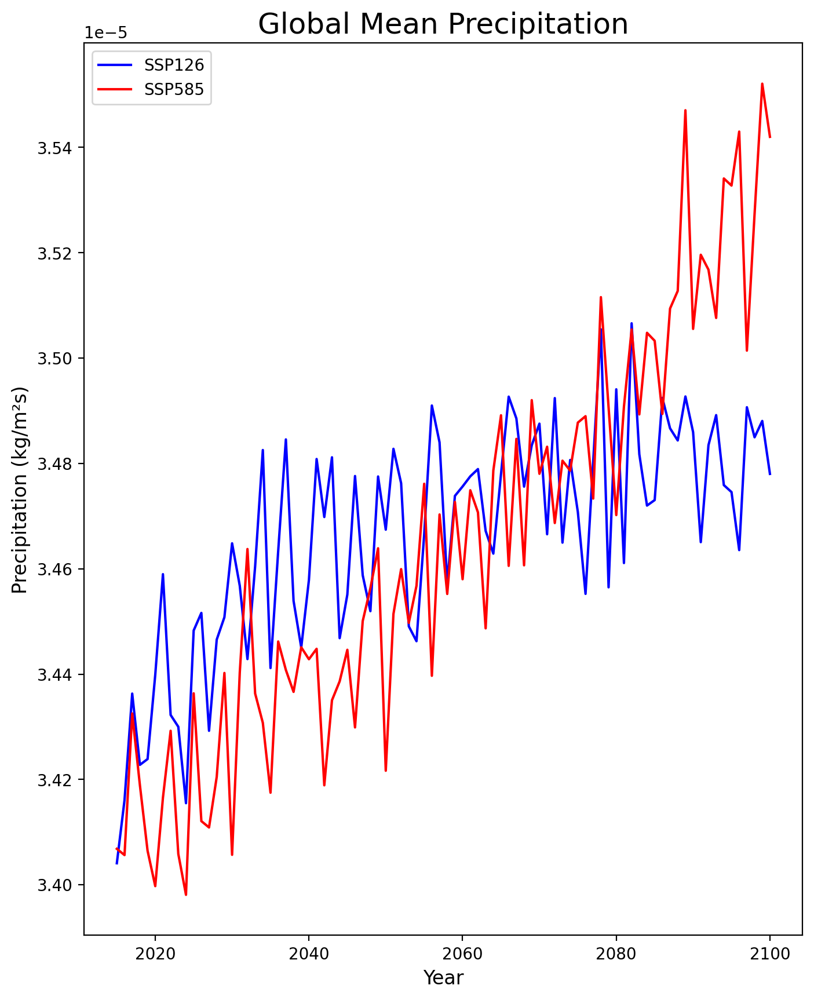

In [138]:
# Establishing figure parameters
fig, ax = plt.subplots(figsize = (8, 10))

# Assigning each dataset to the appropriate axis
mean_pr126.plot(color = 'blue', label = 'SSP126')
mean_pr585.plot(color = 'red', label = 'SSP585')

# Adding figure titles
ax.set_title('Global Mean Precipitation', fontsize = 18)

# Adding axis titles/legends
ax.set_ylabel('Precipitation (kg/m²s)', fontsize = 12)
ax.set_xlabel('Year', fontsize = 12)
ax.legend()

**Figure 5.** Global mean precipitation from 2015-2100. The blue line represents the change in annual precipitation for the SSP1-26 scenario, and the red line represents the change in annual precipitation for the SSP5-85 scenario.

While the precipitation rates are farily comparable within the first 70-75 years, we can see that precipitation rates in the **SSP5-85** scenario begin to pull ahead of **SSP1-26** rates around 2080.

This aligns with what we discussed prior to this figure about how warmer oceans will generally lead to elevated precipitation rates. We won't see this take effect immediately, however, due to water's **high specific heat**. *Specific heat* simply refers to the amount of energy (in this case, heat) required to increase the temperature of an object (in this case, the ocean) by one degree. Since water has a high *specific heat*, and the ocean contains a lot of water, it will take a longer period of time to notice this difference.

### Snowfall Flux

Moving on from the precipitation datasets, I next want to explore how **snowfall flux** will change over time in both the **SSP1-26** and **SSP5-85** scenarios. The same figures produced for precipitation will be produced here as well so we can get a thorough analysis of each variable.

In [139]:
# Creating a climatological average (2015-3035)
# First, select the appropriate time frame (2015-2035)
first20yr_prs126 = prs126.sel(time = slice('2015-01-16', '2035-01-16'))
# Then, calculate the global mean of each gridcell through time
firstavg_prs126 = first20yr_prs126.mean('time')

# Creating a climatological average (2080-2100)
# This is done using the same technique described above.
last20yr_prs126 = prs126.sel(time = slice('2080-12-16', '2100-12-16'))
lastavg_prs126 = last20yr_prs126.mean('time')

# Creating a dataset that calculates the anomaly between the first and last twenty years
# This is done by simply finding the difference between the last and first climatological average
prs126_anomaly = lastavg_prs126 - firstavg_prs126

In [140]:
# Creating a climatological average (2015-3035)
# First, select the appropriate time frame (2015-2035)
first20yr_prs585 = prs585.sel(time = slice('2015-01-16', '2035-01-16'))
# Then, calculate the global mean of each gridcell through time
firstavg_prs585 = first20yr_prs585.mean('time')

# Creating a climatological average (2080-2100)
# This is done using the same technique described above.
last20yr_prs585 = prs585.sel(time = slice('2080-12-16', '2100-12-16'))
lastavg_prs585 = last20yr_prs585.mean('time')

# Creating a dataset that calculates the anomaly between the first and last twenty years
# This is done by simply finding the difference between the last and first climatological average
prs585_anomaly = lastavg_prs585 - firstavg_prs585

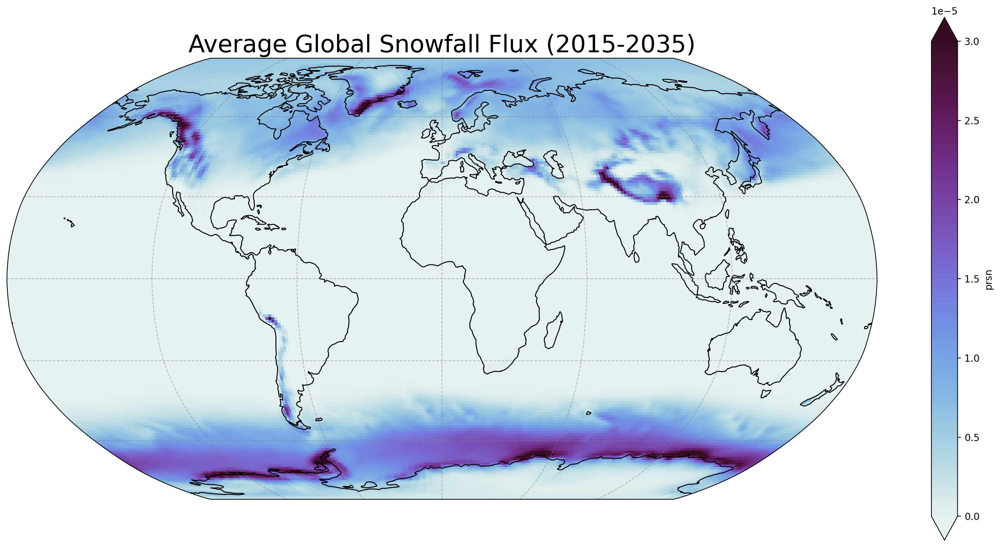

In [141]:
# Establishing figure parameters and ensuring coastlines can be added atop the maps
subplot_kws=dict(projection=ccrs.Robinson())
fig, ax = plt.subplots(figsize = (16, 8), subplot_kw = subplot_kws)

# Plotting each dataset on their perspective axis
firstavg_prs126.plot(cmap = cmocean.cm.dense, vmin = 0, vmax = 0.00003, transform = ccrs.PlateCarree(), extend = 'both')

#Setting figure titles
ax.set_title('Average Global Snowfall Flux (2015-2035)', fontsize = 25)

# Adding coastlines for better visualization
ax.coastlines()

# For nicer spacing
plt.tight_layout()

# Adding gridlines
ax.gridlines(color='grey', alpha=0.5, linestyle='--')

**Figure 6.** Global map depicting the climatological average for snowfall flux across a set timeframe (2015-2035).

The **snowfall flux** present on this map does make sense, as high rates of snowfall only occur in higher latitudes (*above 35-40N or S*), areas of high elevation (*the mountain ranges on the West Coast of South America, for example*), or in the cryosphere (near the poles). Warmer areas in lower latitudes, however, will simply have a **snowfall flux** of zero.

One unique scenario to look at is around Antarctica, where the **snowfall flux** is drastically different when looking at the landmass and surrounding ocean. **Why would snow fall around Antarctica, but not on Antarctica?**

This is primarily due to water availability, as the ocean surrounding Antarctica is also cooler due to sea ice. However, an open ocean features increased rates of evaporation and therefore condensation, resulting in more snowfall events.

After looking at global **snowfall flux** map, let's take a look at the resulting **snowfall flux anomalies**.

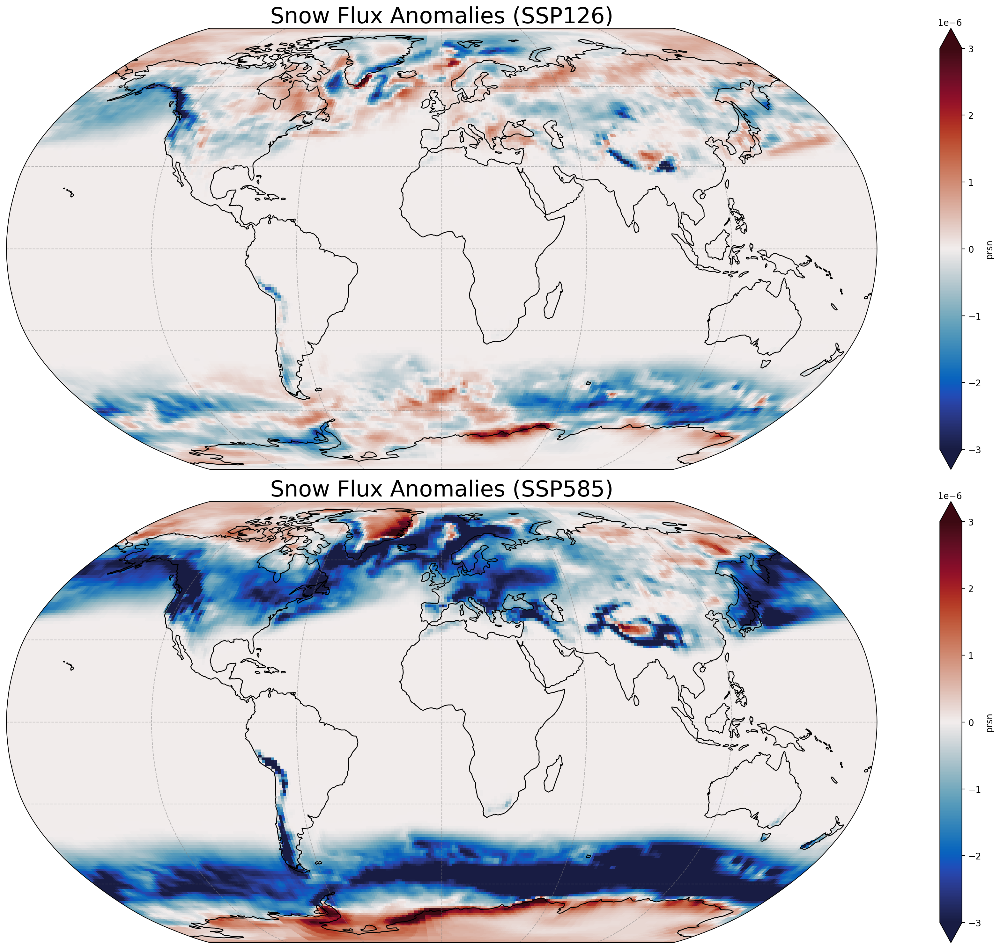

In [142]:
# Establishing figure parameters and ensuring coastlines can be added atop the maps
subplot_kws=dict(projection=ccrs.Robinson())
fig, (ax1, ax2) = plt.subplots(ncols = 1, nrows = 2, figsize = (20, 15), subplot_kw = subplot_kws)

# Plotting each dataset on their perspective axis
prs126_anomaly.plot(ax = ax1, cmap = cmocean.cm.balance, vmin = -0.000003, vmax = 0.000003, transform = ccrs.PlateCarree(), extend = 'both')
prs585_anomaly.plot(ax = ax2, cmap = cmocean.cm.balance, vmin = -0.000003, vmax = 0.000003, transform = ccrs.PlateCarree(), extend = 'both')

#Setting figure titles
ax1.set_title('Snow Flux Anomalies (SSP126)', fontsize = 25)
ax2.set_title('Snow Flux Anomalies (SSP585)', fontsize = 25)

# Adding coastlines for better visualization
ax1.coastlines()
ax2.coastlines()

# For nicer spacing
plt.tight_layout()

# Adding gridlines
ax1.gridlines(color='grey', alpha=0.5, linestyle='--')
ax2.gridlines(color='grey', alpha=0.5, linestyle='--')

**Figure 7.** Snowfall flux anomalies relative to a 2015-2035 baseline. The top map shows snowfall flux anomalies for the SSP1-26 scenario, and the bottom shows anomalies for the SSP5-85 scenario.

While calculating the anomalies for **snowfall flux**, the results were not what I would've originally expected. In the **SSP1-26** scenario, no extreme anomalies are present, with most values around the globe being constrained between 1 to -2, with some areas being slightly outside this margin. This is expected, as this scenario features relatively small differences when analyzing each variable since it's the 'green' pathway. There are still some notable losses of snowfall over the ocean or on coasts, which can be attributed to the fact that emissions don't cause an immediate global change in climate, but rather happens slowly over a long period of time. So, even when severely reducing emissions, past emissions (*potentially from earlier in the scenario around 2015-2020*) could stll make impacts in the future.

In the **SSP5-85** scenario, however, some interesting trends can be noted. Firstly, the **snowfall flux** in oceans and on the coast seem to drop dramatically in most areas, as well as higher elevations like in the West Coast of North or South America. An increase of **snowfall flux** can be noted predominantly at the poles, which could be attributed to the **Polar cells** we discussed earlier. When looking at the picture on cells provided above, we can see that air is moved from the ocean toward the poles before being moved back to the ocean. Increasing temperatures seen in the **SSP5-85** scenario means that warmer air from the ocean is being transported to Antarctica, moving the low pressure zone from over the ocean to over the continent. This low pressure system is then moved back out into the ocean, resulting in inverse conditions from what we saw at the beginning of the dataset (*Global Atmospheric Circulations*)

This can also be seen in the Arctic region, as the lower latitudes of the North Pole experience a massive loss in **snowfall flux**, but the higher latitudes of the poles experience a moderate to more extreme increase in **snowfall flux**.

The larger implications of climate change could in fact be the shifting of the global atmospheric circulations, particularly in each cell, which could result in us experiencing changing weather phenomena across the globe.

Next, let's take a look at **Latitudinal Cross Sections of Snowfall Flux** in both the **SSP1-26** and **SSP5-85** scenarios.

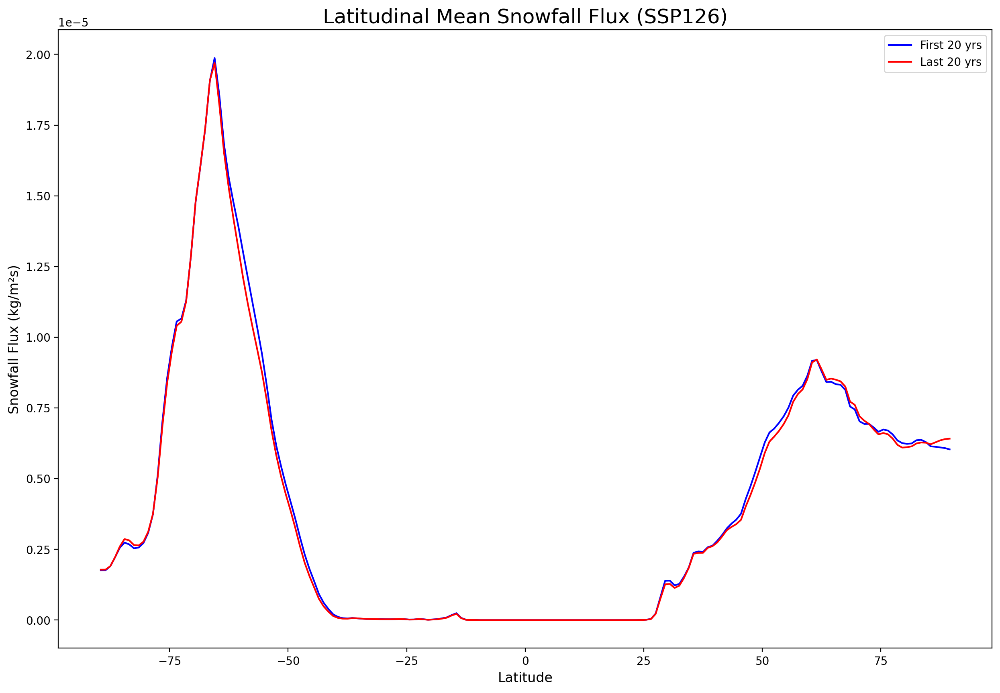

In [143]:
# Establishing figure parameters
fig, ax = plt.subplots(figsize = (15, 10))

# Assigning each dataset to the appropriate axis
# The code below finds the mean snowfall flux across global latitude, which can then be plotted on a graph to observe latitudinal changes in snowfall
firstavg_prs126.mean(dim = 'longitude').plot(color = 'blue', label = 'First 20 yrs')
lastavg_prs126.mean(dim = 'longitude').plot(color = 'red', label = 'Last 20 yrs')

# Adding figure titles
ax.set_title('Latitudinal Mean Snowfall Flux (SSP126)', fontsize = 18)

# Adding axis titles/legends
ax.set_ylabel('Snowfall Flux (kg/m²s)', fontsize = 12)
ax.set_xlabel('Latitude', fontsize = 12)
ax.legend()

**Figure 8.** Latitudinal cross section of mean snowfall flux across two timeframes in the SSP1-26 scenario. The blue line represents the first twenty years (2015-2035) of the dataset, and the red line represents the last twenty years (2080-2100).

Similarly to the precipitation cross section, the first and last twenty years of the **SSP1-26** scenario are essentially the same, as expected. The real differences will come from taking a look at the **SSP5-85** scenario.

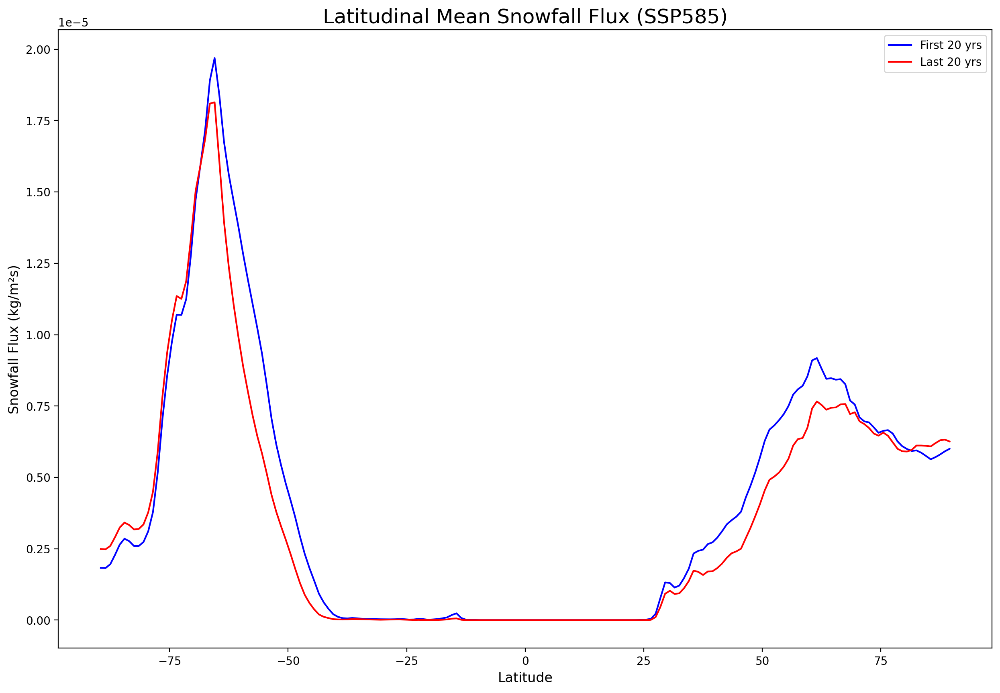

In [144]:
# Establishing figure parameters
fig, ax = plt.subplots(figsize = (15, 10))

# The code below finds the mean snowfall flux across global latitude, which can then be plotted on a graph to observe latitudinal changes in snowfall
firstavg_prs585.mean(dim = 'longitude').plot(color = 'blue', label = 'First 20 yrs')
lastavg_prs585.mean(dim = 'longitude').plot(color = 'red', label = 'Last 20 yrs')

# Adding figure titles
ax.set_title('Latitudinal Mean Snowfall Flux (SSP585)', fontsize = 18)

# Adding axis titles/legends
ax.set_ylabel('Snowfall Flux (kg/m²s)', fontsize = 12)
ax.set_xlabel('Latitude', fontsize = 12)
ax.legend()

**Figure 9.** Latitudinal cross section of mean snowfall flux across two timeframes in the SSP5-85 scenario. The blue line represents the first twenty years (2015-2035) of the dataset, and the red line represents the last twenty years (2080-2100).

As expected, the **snowfall flux** decreased in most areas, with a slight increase being seen near the poles. This makes sense, as we discussed earlier, as the **snowfall flux** moved from the lower latitudes of the polar cells to the higher latitudes. These increases in the graph coincide with the anomalies seen in the previous graph.

In the lower latitudes that experience annual snowfall, global warming results in an overall drop in **snowfall flux**, meaning that snow accumulation will shift closer to the poles, as well as shift further up mountains in some areas.

Finally, let's **compare differences in global mean snowfall flux in the SSP1-26 and SSP5-85 scenarios.**

Just like with the precipitation dataset, we must add the gridcell weight to each cell across the globe, which is done in the code below.

In [145]:
# Placing the weighted cells atop our already created dataset using the .weighted() function
# Then, using the .mean() function over latitude and longitude will produce a dataset showing mean global averages through time
weighted_prs126 = prs126.weighted(areacell_xarray).mean(['latitude', 'longitude']) 
weighted_prs585 = prs585.weighted(areacell_xarray).mean(['latitude', 'longitude']) 

In [146]:
# Calculating global mean precipitation by using weighted datasets, grouping by year, and getting a mean value for each year
mean_prs126 = weighted_prs126.groupby('time.year').mean(dim = 'time')
mean_prs585 = weighted_prs585.groupby('time.year').mean(dim = 'time')

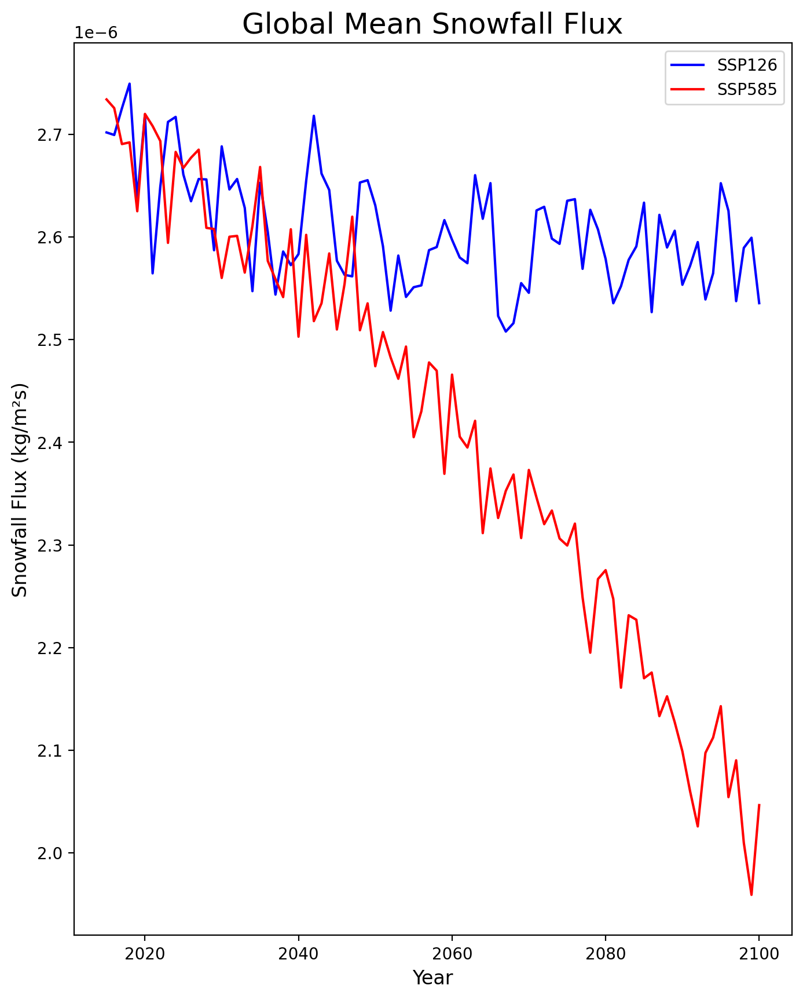

In [147]:
# Establishing figure parameters
fig, ax = plt.subplots(figsize = (8, 10))

# Assigning each dataset to the appropriate axis
mean_prs126.plot(color = 'blue', label = 'SSP126')
mean_prs585.plot(color = 'red', label = 'SSP585')

# Adding figure titles
ax.set_title('Global Mean Snowfall Flux', fontsize = 18)

# Adding axis titles/legends
ax.set_ylabel('Snowfall Flux (kg/m²s)', fontsize = 12)
ax.set_xlabel('Year', fontsize = 12)
ax.legend()

**Figure 10.** Global mean snowfall flux from 2015-2100. The blue line represents the change in annual snowfall flux for the SSP1-26 scenario, and the red line represents the change in annual snowfall flux for the SSP5-85 scenario.

Even with increased rates of **snowfall flux** in the higher latitudes of the poles, the overall rate of global **snowfall flux** in the **SSP5-85** scenario is significantly lower than in the **SSP1-26** scenario. This is expected, though, as an increase in global temperatures will cause a decrease in **snowfall flux**, but will cause a subsequent increase in **precipitation**, a trend we see in our graph for global mean **precipitation** between the two scenarios.

### Sea Surface Salinity

In [148]:
baseline_salinity_first_years = gfdl_esm4_sos_126.sel(time=slice('2015-01-16', '2035-01-01')).mean(dim='time')
baseline_salinity_last_years = gfdl_esm4_sos_126.sel(time=slice('2080-12-16', '2100-12-16')).mean(dim='time')

In [149]:
baseline_salinity_first_years_585 = gfdl_esm4_585_sos.sel(time=slice('2015-01-16', '2035-01-01')).mean(dim='time')
baseline_salinity_last_years_585 = gfdl_esm4_585_sos.sel(time=slice('2080-12-16', '2100-12-16')).mean(dim='time')
baseline_difference_585 = baseline_salinity_last_years_585 - baseline_salinity_first_years_585

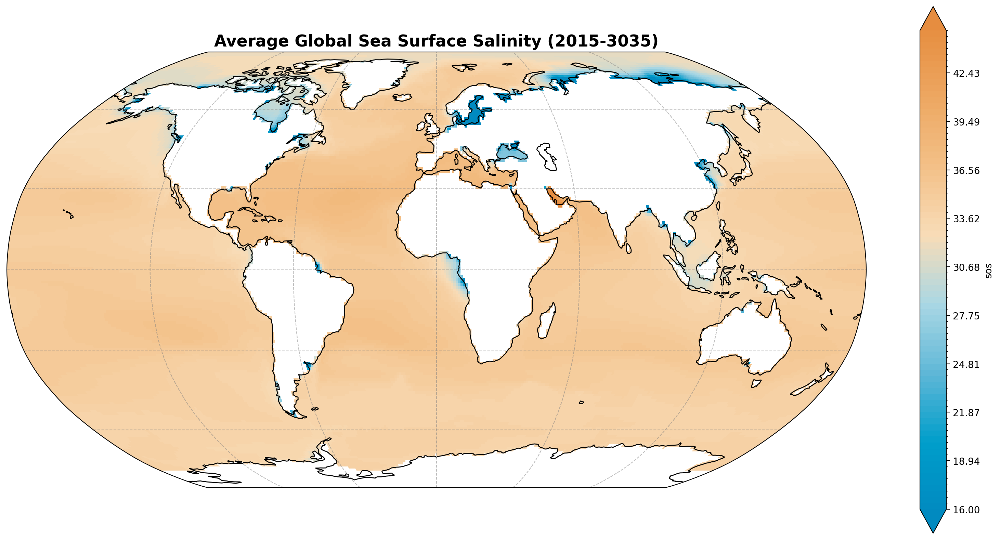

In [150]:
subplot_kws=dict(projection=ccrs.Robinson())

### set up our figure settings
fig, ax = plt.subplots(figsize = (16, 8), 
                       subplot_kw = subplot_kws) ## set up our plotting area

### plot our data
baseline_salinity_first_years.plot(cmap = wocemaps.salinity, levels = 80, vmin = 16, vmax = 45, transform = ccrs.PlateCarree(), extend = 'both')

## customize our subplots
ax.set_title("Average Global Sea Surface Salinity (2015-3035)", fontweight='bold', fontsize=17)

plt.tight_layout() ## make it look nicely spaced!

ax.coastlines()

# Adding gridlines
ax.gridlines(color='grey', alpha=0.5, linestyle='--')

**Figure 11.** Global map depicting the climatological average for sea surface salinity across a set timeframe (2015-2035).

Sea surface salinity is directly affected by temperature and the overall water cycle of the earth. Salinity is generally a very stable value that does not fluctuate and change very much. Water tends to be fresher around the noth and south poles due to the melting of sea ice and evaporation. Changes in salinity can tell you how much precipitation the ocean got in a year or a specific area.

Major events in climate such and El Nino and La Nina can also affect erath's salinity. In the La nina years, places like Australia and the Philippines recieve more rainfall and the Indian Ocean recieves more freshwater than normal, reducing the salinity. Seawater desnity is also a factor to consider when talking about salinity. Salinity affects ocena circulation because saliter water is denser than freshwater, affecting the circulation of water and also how much heat is carried within these currents.

In this scenario, emissions don't increase substantially, but level off and plateau from the current value. These graphs show how levels of salinity increase by a very minute amount. This is because global warming patterns increase evaporation and concentrates water in the North Atlantic because currents combined with trade winds carry moisture to the Pacific.

In [151]:
baseline_difference = baseline_salinity_last_years - baseline_salinity_first_years

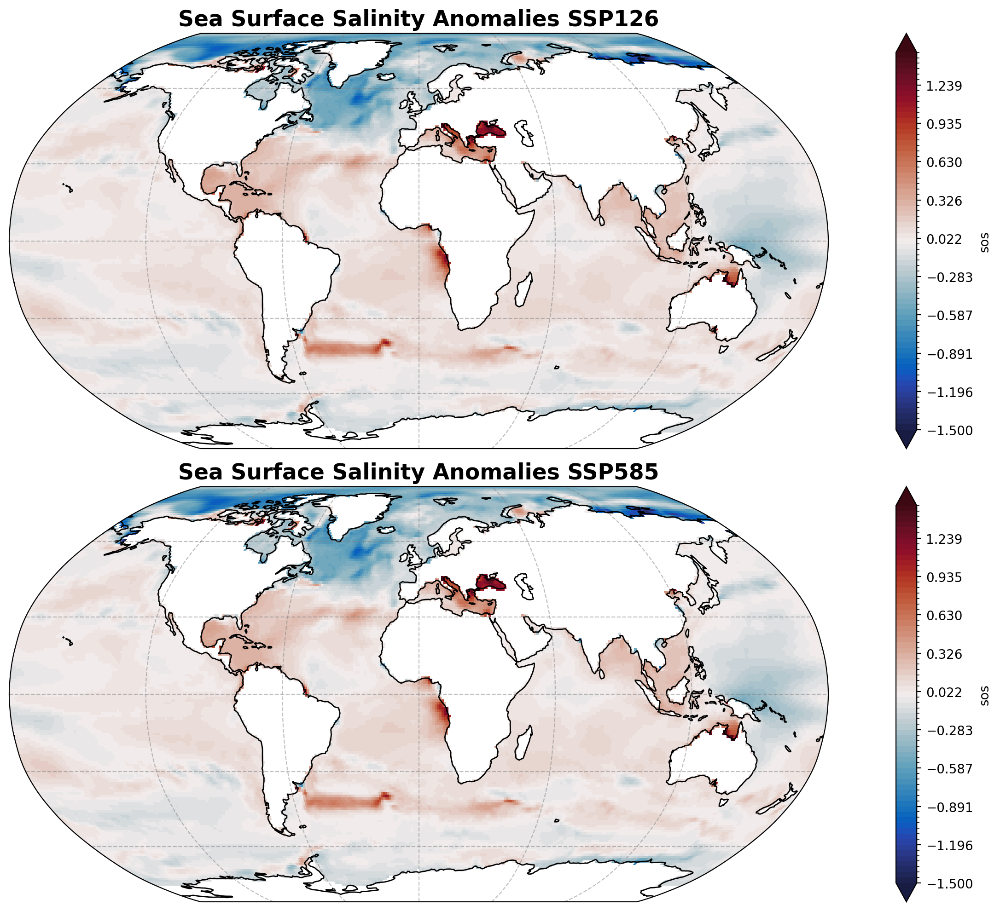

In [152]:
subplot_kws=dict(projection=ccrs.Robinson())

### set up our figure settings
fig, (ax1,ax2) = plt.subplots(ncols=1,
                               nrows=2,
                               figsize=(15,10),
                               subplot_kw=subplot_kws) ## set up our plotting area

### plot our data
baseline_difference.plot(ax=ax1, cmap = cmocean.cm.balance, extend='both', vmin=-1.5, vmax=1.5, levels=70,
                                transform=ccrs.PlateCarree())
baseline_difference_585.plot(ax=ax2, cmap = cmocean.cm.balance, extend='both', vmin=-1.5, vmax=1.5, levels=70,
                                transform=ccrs.PlateCarree())

## customize our subplots
ax1.set_title("Sea Surface Salinity Anomalies SSP126", fontweight='bold', fontsize= 17)
ax2.set_title("Sea Surface Salinity Anomalies SSP585", fontweight='bold', fontsize = 17)

plt.tight_layout() ## make it look nicely spaced!

### add some coastlines
ax1.coastlines()
ax2.coastlines()

# Adding gridlines
ax1.gridlines(color='grey', alpha=0.5, linestyle='--')
ax2.gridlines(color='grey', alpha=0.5, linestyle='--')

**Figure 12.** Global Sea Surface Salinity Anomalies from scenario SSP585, relative to a baseline of data from 2015-2035.

Anomalies in climate data can give you information on how much the percent of your variable has changed from its' baseline values. In this case, The baseline differences from the first dataset from the beginning of the time period (2015-2035) are subtracted from the last 20 year period (2080-2100) to create a graph showing the change in salinity. The salinity levels increase around the equator and decrease around the poles, due to moisture being carried from subtropical zones and towards the poles, combined with trade winds to decrease the salinity in those areas. In terms of both climate scenarios, SSP126 and SSP585, there is not a noticable difference in the graphs for the anomallies. This is because on average, sea surface salinity only changes by less than one percent, which although can make a big difference even if it is not very noticable on the graph. However, this can help us to understand how salinity levels will follow ocean circulation and evaporation patterns that will carry more freshwater into northern latitiudes.

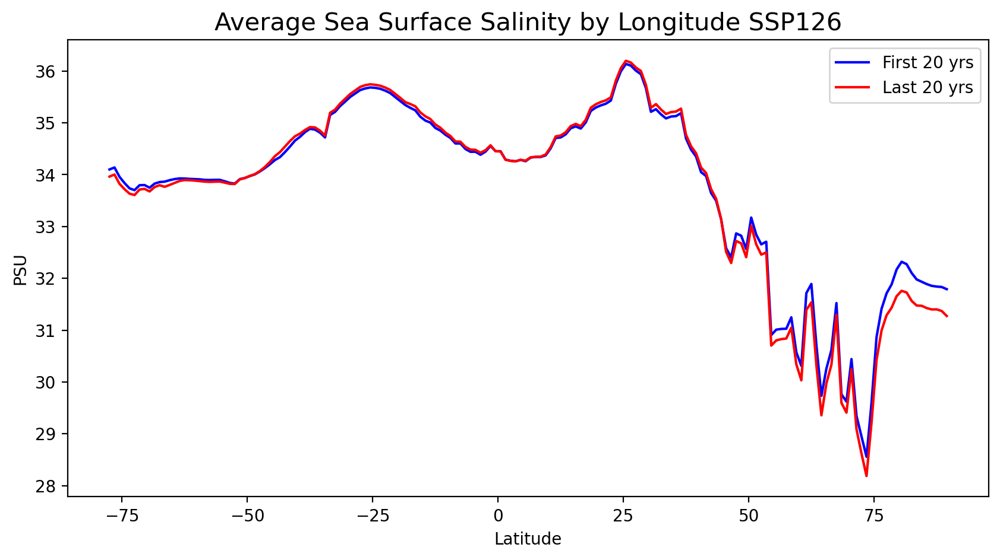

In [153]:
fig, ax = plt.subplots(figsize = (10,5))
avg_first_yearsos_126 = baseline_salinity_first_years.mean(dim = 'longitude').plot(color = 'blue', label='First 20 yrs')
avg_last_yearsos_126 = baseline_salinity_last_years.mean(dim = 'longitude').plot(color = 'red', label='Last 20 yrs')
ax.set_title('Average Sea Surface Salinity by Longitude SSP126', fontsize = 15)
ax.set_xlabel('Latitude')
ax.set_ylabel("PSU")
ax.legend()

**Figure 13.** Longitudinal Global Average Sea Surface Salinity from scenario SSP126

Increased carbon emissions coincide with decreased sea ice concentration in the north and south poles, and therefore pushing more freshwater into the ocean which can decrease the salinity. In scenario SSP126, it is clear that Since the south pole has less land mass and therefore more sea ice, it has a higher salinity due to the sea ice expelling salt into the water when it freezes. This could be the cause for higher salinity levels in the south pole and lower salinity in the north pole.

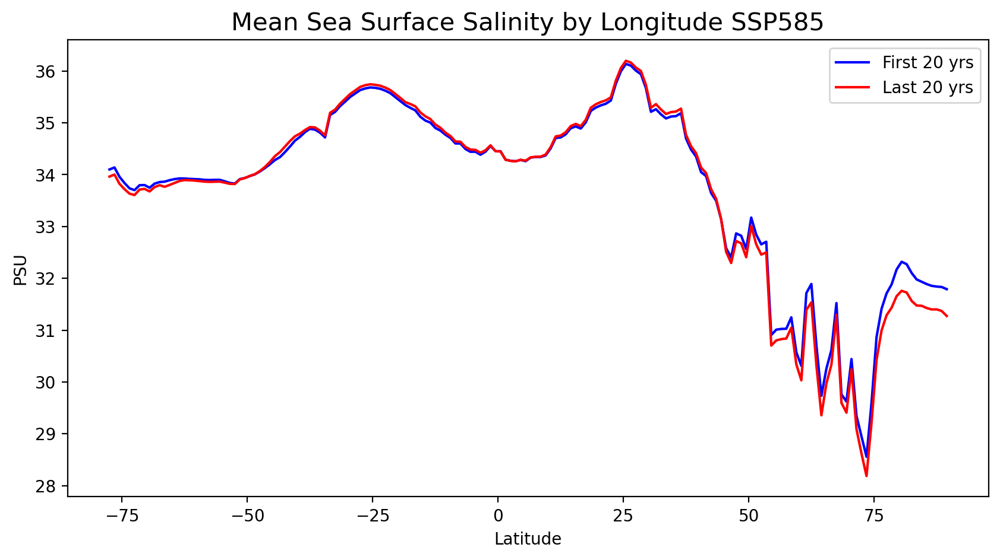

In [154]:
fig, ax = plt.subplots(figsize = (10,5))
avg_first_yearsos_585 = baseline_salinity_first_years_585.mean(dim = 'longitude').plot(color = 'blue', label='First 20 yrs')
avg_last_yearsos_585 = baseline_salinity_last_years_585.mean(dim = 'longitude').plot(color = 'red', label='Last 20 yrs')
plt.title("Average Sea Surface Salinity by Latitude SSP585")
ax.set_title('Mean Sea Surface Salinity by Longitude SSP585', fontsize = 15)
ax.set_xlabel('Latitude')
ax.set_ylabel("PSU")
ax.legend()

**Figure 14.** Mean Logitudinal Average Sea Surface Salinity from scenario SSP585

The differences of the two cross section graphs by longitude are very minute. With both scenarios following the same trends and having more freshwater in the north and saltier water in the south, There is not a lot of variation in the trends. At around 25N the salinity levels decrease and the water becomes fresher, following the same trends that I have discussed previously.

Climate change can amplify the earth's hydrologic cycle by increasing the amount of evaporation, precipitation that happens on earth. This significantly influences ocean's salinity. As water evaporates from the oceans, it leaves behind salts, increasing the salinity of the leftover water. This is more evident in warmer regions with high evaporation rates. Processes of the cycle, like precipitation runoff and evaporation lead to variations in salinity across the ocean.

### Evaporation

In [155]:
baseline_evap_first_years = gfdl_esm4_126_evap.sel(time=slice('2015-01-16', '2035-01-01')).mean(dim='time')
baseline_evap_last_years = gfdl_esm4_126_evap.sel(time=slice('2080-12-16', '2100-12-16')).mean(dim='time')
difference_evap_126 = baseline_evap_last_years - baseline_evap_first_years

In [156]:
baseline_evap_first_years_585 = gfdl_esm4_585_evap.sel(time=slice('2015-01-16', '2035-01-01')).mean(dim='time')
baseline_evap_last_years_585 = gfdl_esm4_585_evap.sel(time=slice('2080-12-16', '2100-12-16')).mean(dim='time')

In [157]:
difference_evap_585 = baseline_evap_last_years_585 - baseline_evap_first_years_585

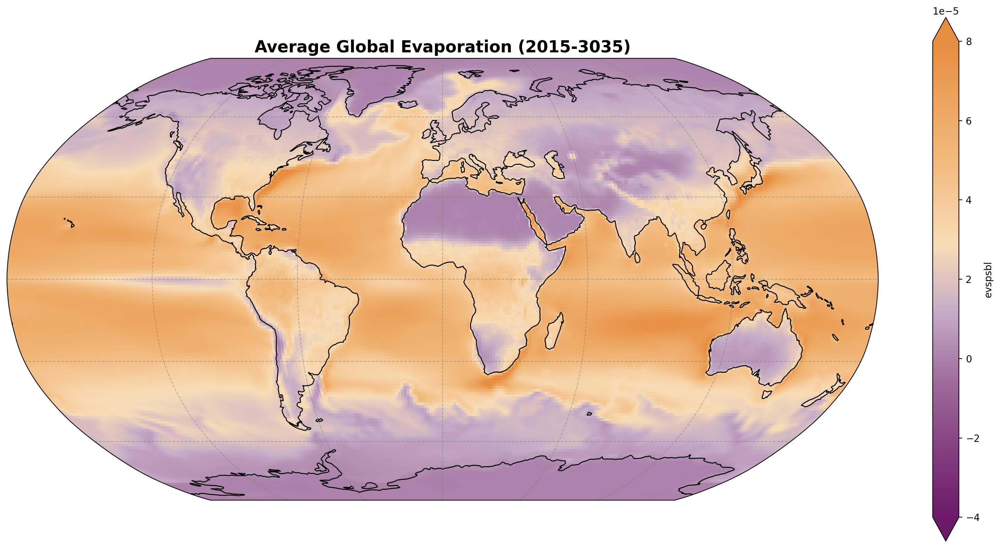

In [158]:
subplot_kws=dict(projection=ccrs.Robinson())

### set up our figure settings
fig, ax = plt.subplots(figsize = (16, 8), 
                       subplot_kw = subplot_kws) ## set up our plotting area

### plot our data
baseline_evap_first_years.plot(cmap = wocemaps.alkalinity, vmin = -0.00004, vmax = 0.00008, transform = ccrs.PlateCarree(), extend = 'both')

## customize our subplots
ax.set_title("Average Global Evaporation (2015-3035)", fontweight='bold', fontsize=17)

plt.tight_layout() ## make it look nicely spaced!

ax.coastlines()

# Adding gridlines
ax.gridlines(color='grey', alpha=0.5, linestyle='--')

**Figure 15.** Global map depicting the climatological average for evaporation across a set timeframe (2015-2035).

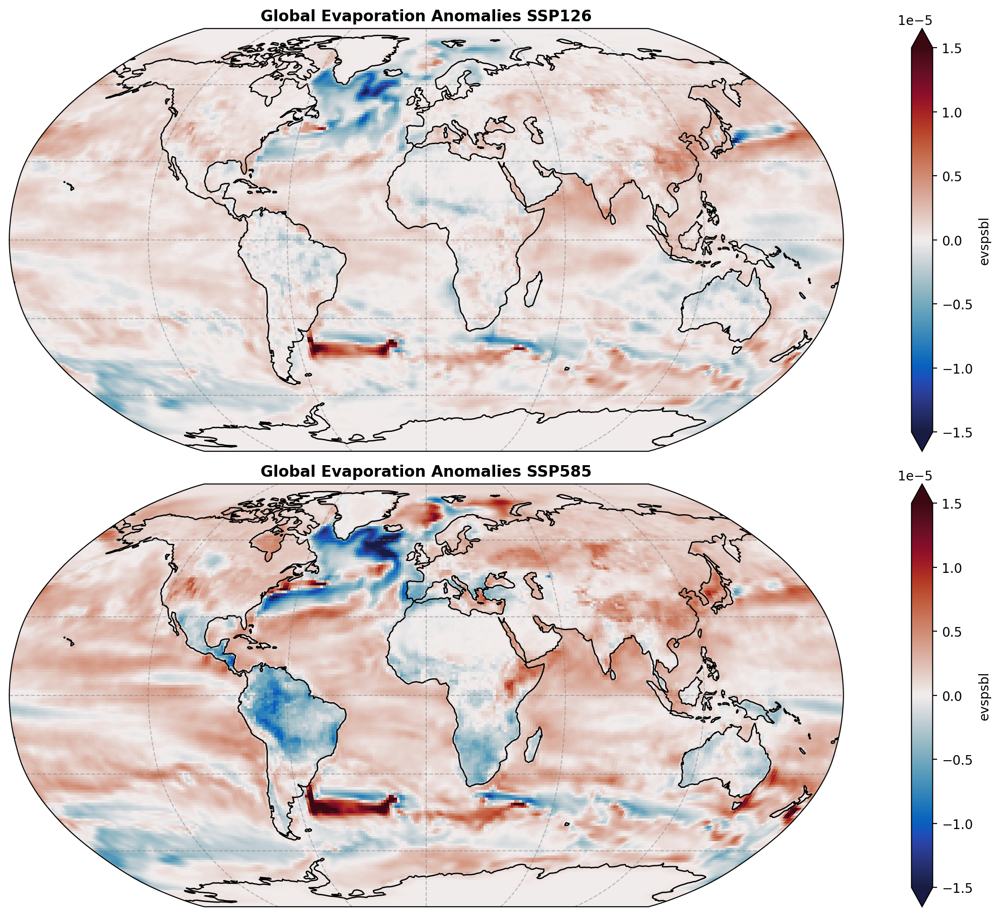

In [159]:
subplot_kws=dict(projection=ccrs.Robinson())

### set up our figure settings
fig, (ax1, ax2) = plt.subplots(ncols=1,
                               nrows=2,
                               figsize=(15,10),
                               subplot_kw=subplot_kws) ## set up our plotting area

### plot our data
difference_evap_126.plot(ax=ax1, cmap = cmocean.cm.balance,extend='both', vmin = -0.000015, vmax = 0.000015,
                                transform=ccrs.PlateCarree())
difference_evap_585.plot(ax=ax2, cmap = cmocean.cm.balance,extend='both', vmin = -0.000015, vmax = 0.000015,
                                transform=ccrs.PlateCarree())

## customize our subplots
ax2.set_title("Global Evaporation Anomalies SSP585", fontweight='bold')
## customize our subplots
ax1.set_title("Global Evaporation Anomalies SSP126", fontweight='bold')

plt.tight_layout() ## make it look nicely spaced!
### add some coastlines
ax1.coastlines()
ax2.coastlines()

# Adding gridlines
ax1.gridlines(color='grey', alpha=0.5, linestyle='--')
ax2.gridlines(color='grey', alpha=0.5, linestyle='--')

**Figure 16.**  Average evaporation including transpiration and sublimination anomalies from scenario SSP126 (top graph) and scenario SSP585(bottom graph).

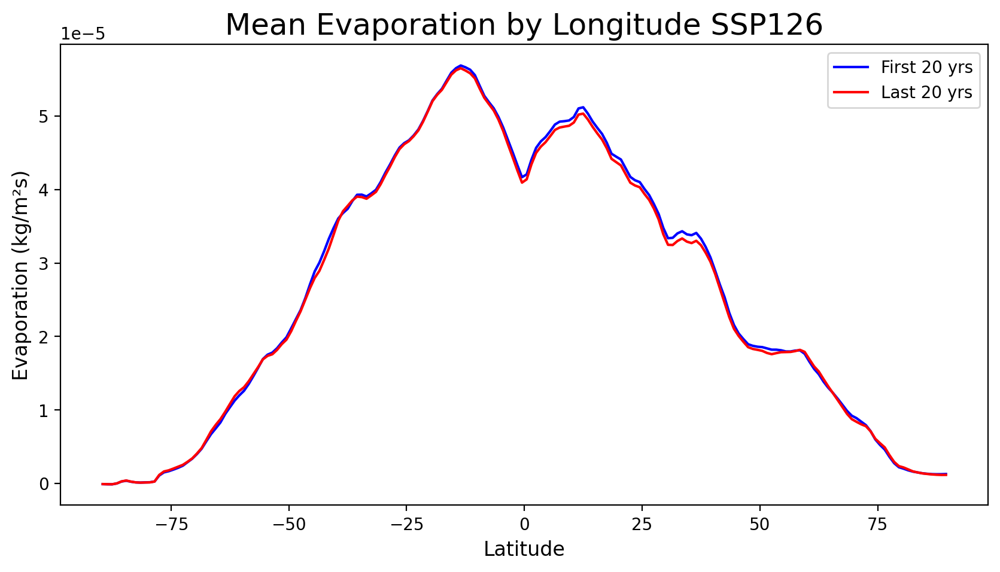

In [160]:
fig, ax = plt.subplots(figsize = (10,5))

avg_first_year_evap_126 = baseline_evap_last_years.mean(dim = 'longitude').plot(color = 'blue', label='First 20 yrs')
avg_last_year_evap_126 = baseline_evap_first_years.mean(dim = 'longitude').plot(color = 'red', label='Last 20 yrs')
# Adding figure titles
ax.set_title('Mean Evaporation by Longitude SSP126', fontsize = 18)

# Adding axis titles/legends
ax.set_ylabel('Evaporation (kg/m²s)', fontsize = 12)
ax.set_xlabel('Latitude', fontsize = 12)
ax.legend()

**Figure 17.**  Average evaporation by Longitude from SSP126 from 2015-2100.

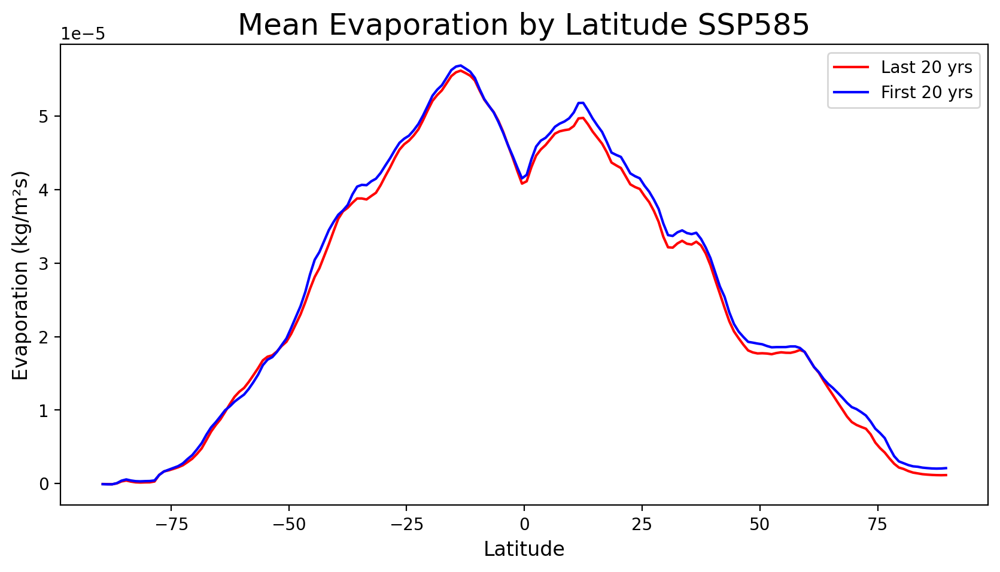

In [161]:
fig, ax = plt.subplots(figsize = (10,5))

avg_first_year_evap_585 = baseline_evap_last_years_585.mean(dim = 'longitude')
avg_last_year_evap_585 = baseline_evap_first_years_585.mean(dim = 'longitude')
avg_last_year_evap_585.plot(color='red', label='Last 20 yrs')
avg_first_year_evap_585.plot(color='blue', label='First 20 yrs')

ax.set_title('Mean Evaporation by Latitude SSP585', fontsize = 18)

# Adding axis titles/legends
ax.set_ylabel('Evaporation (kg/m²s)', fontsize = 12)
ax.set_xlabel('Latitude', fontsize = 12)
ax.legend()

**Figure 18.** Average evaporation by Longitude from SSP126 from 2015-2100.

### Water Vapor Content

To finish our analysis, let's take a look at the **water vapor content** datasets and how they change over time.

We'll first look at the **average global water vapor content** of the first twenty years of the dataset:

In [162]:
# Creating a climatological average (2015-3035)
# First, select the appropriate time frame (2015-2035)
first20yr_prw585 = prw585.sel(time = slice('2015-01-16', '2035-01-16'))
# Then, calculate the global mean of each gridcell through time
firstavg_prw585 = first20yr_prw585.mean('time')

# Creating a climatological average (2080-2100)
# This is done using the same technique described above.
last20yr_prw585 = prw585.sel(time = slice('2080-12-16', '2100-12-16'))
lastavg_prw585 = last20yr_prw585.mean('time')

# Creating a dataset that calculates the anomaly between the first and last twenty years
# This is done by simply finding the difference between the last and first climatological average
prw585_anomaly = lastavg_prw585 - firstavg_prw585

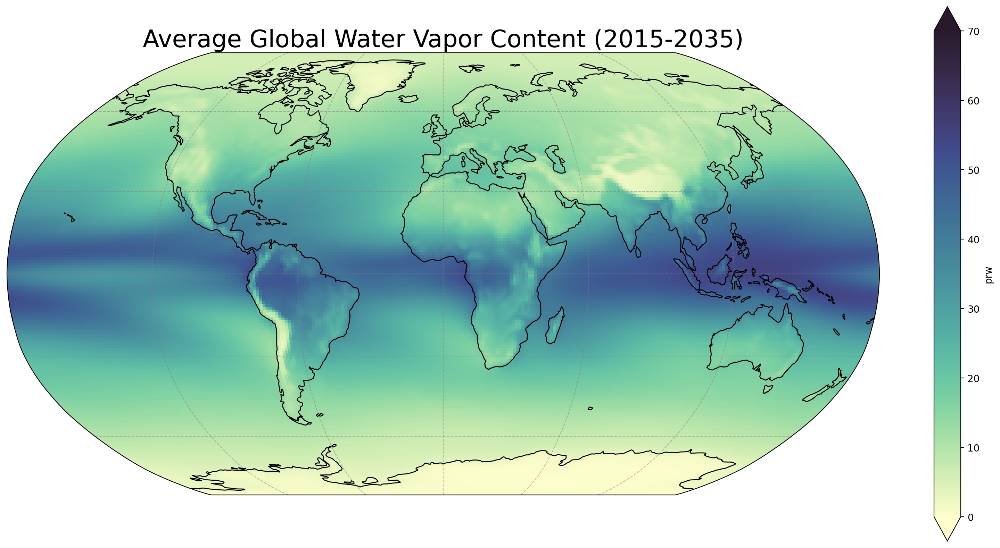

In [163]:
# Establishing figure parameters and ensuring coastlines can be added atop the maps
subplot_kws=dict(projection=ccrs.Robinson())
fig, ax = plt.subplots(figsize = (16, 8), subplot_kw = subplot_kws)

# Plotting each dataset on their perspective axis
firstavg_prw585.plot(cmap = cmocean.cm.deep, vmin = 0, vmax = 70, transform = ccrs.PlateCarree(), extend = 'both')

#Setting figure titles
ax.set_title('Average Global Water Vapor Content (2015-2035)', fontsize = 25)

# Adding coastlines for better visualization
ax.coastlines()

# For nicer spacing
plt.tight_layout()

# Adding gridlines
ax.gridlines(color='grey', alpha=0.5, linestyle='--')

**Figure 19.** Global map depicting the climatological average for water vapor content across a set timeframe (2015-2035).

As we can see, the global distribution of **water vapor content** aligns with the topics we already discussed thus far. The content would be highest around the equator, as this is where the hottest temperatures, and therefore the highest levels of evaporation, would be seen. As we move farther from the equator, cooler temperatures, and therefore lower levels of evaporation, will be seen. In particular, areas over land at each latitude experience generally lower levels  of **water vapor content** than the surrounding ocean due to overall water availability.

We'll now look at the **water vapor content anomalies** seen in both the **SSP1-26** and **SSP5-85** scenarios.

In [164]:
wv_first_years_126 = gfdl_esm4_126_wv.sel(time=slice('2015-01-16', '2035-01-01')).mean(dim='time')
wv_last_years_126 = gfdl_esm4_126_wv.sel(time=slice('2080-12-16', '2100-12-16')).mean(dim='time')
difference_wv_126 = wv_last_years_126 - wv_first_years_126

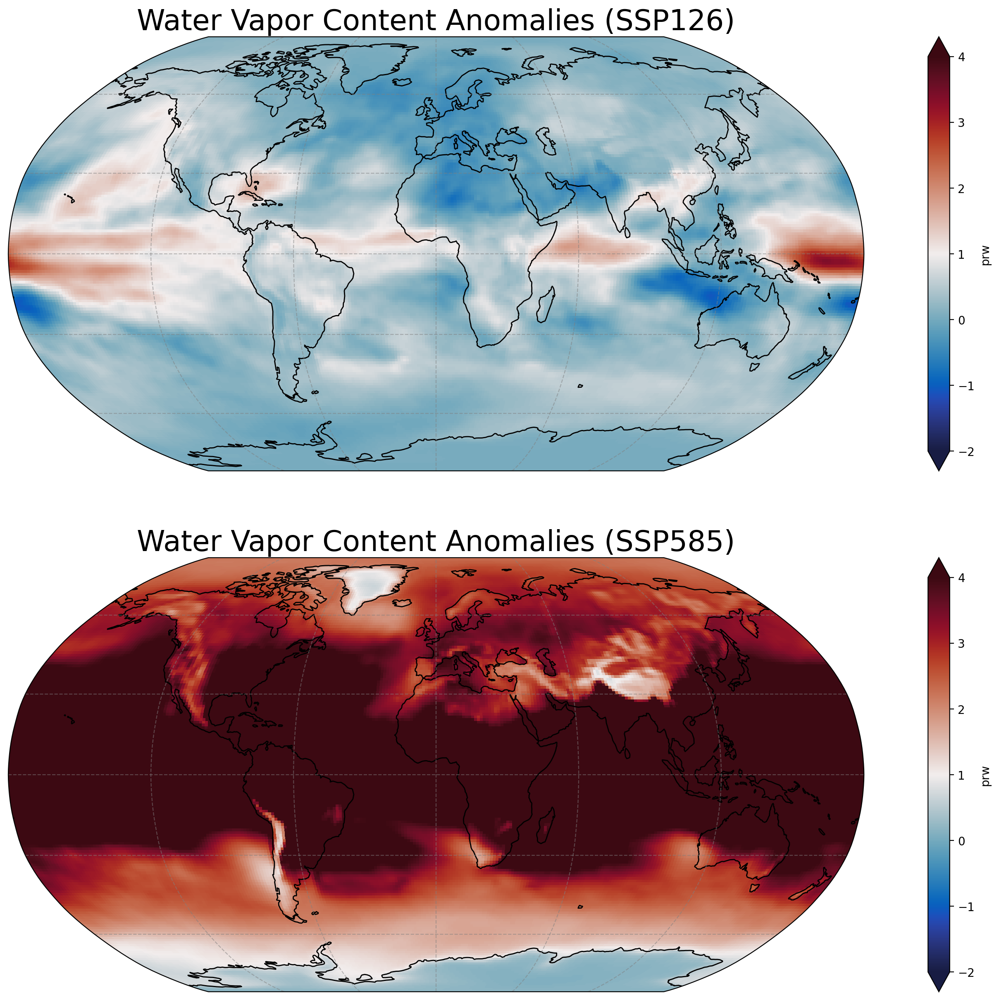

In [165]:
# Establishing figure parameters and ensuring coastlines can be added atop the maps
subplot_kws=dict(projection=ccrs.Robinson())
fig, (ax1, ax2) = plt.subplots(ncols = 1, nrows = 2, figsize = (20, 15), subplot_kw = subplot_kws)

# Plotting each dataset on their perspective axis
difference_wv_126.plot(ax=ax1, cmap = cmocean.cm.balance, vmin = -2, vmax = 4, extend='both',
                                transform=ccrs.PlateCarree())
prw585_anomaly.plot(ax = ax2, cmap = cmocean.cm.balance, transform = ccrs.PlateCarree(), vmin = -2, vmax = 4, extend = 'both')

#Setting figure titles
ax1.set_title('Water Vapor Content Anomalies (SSP126)', fontsize = 25)
ax2.set_title('Water Vapor Content Anomalies (SSP585)', fontsize = 25)

# Adding coastlines for better visualization
ax1.coastlines()
ax2.coastlines()

# Adding gridlines
ax1.gridlines(color='grey', alpha=0.5, linestyle='--')
ax2.gridlines(color='grey', alpha=0.5, linestyle='--')

**Figure 20.** Snowfall flux anomalies relative to a 2015-2035 baseline. The top map shows water vapor content anomalies for the SSP1-26 scenario, and the bottom map shows water vapor content anomalies for the SSP5-85 scenario.

When comparing the **SSP1-26** anomalies to the **SSP5-85** anomalies, a stark difference can be noted. The increase in water vapor content in the **SSP1-26** scenario is rather mild, while in the **SSP5-85** scenario, a dramatic increase in global water vapor content can be seen. The close you get to the equator, however, the higher the increase in water vapor content gets. This would make sense, as the equator already recieves the highest amount of solar radiation, which will only increase with increasing rates of climate change. Land masses in the polar regions of the world, such as Greenland or Antarctica, experience the lowest increase in **water vapor content**, which would be expected, as **water vapor content** decreases over land masses and as latitude increases. When both of these parameters are present, the lowest increase in **water vapor content** will be seen.

Now, we can look at the **Latitudinal Cross Sections of Water Vapor Content** in both the **SSP1-26** and **SSP5-85** scenarios.

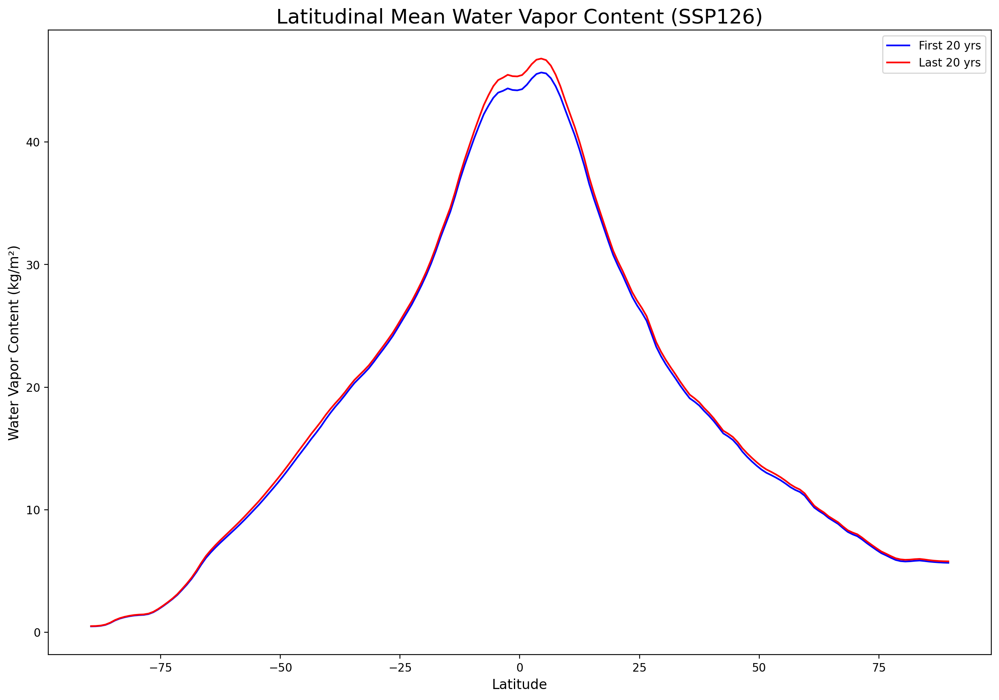

In [166]:
fig, ax = plt.subplots(figsize = (15,10))

av_wv_first_years_126 = wv_first_years_126.mean(dim='longitude').plot(color='blue', label='First 20 yrs')
avg_wv_last_years_126 = wv_last_years_126.mean(dim='longitude').plot(color = 'red', label='Last 20 yrs')
ax.set_title('Latitudinal Mean Water Vapor Content (SSP126)', fontsize = 18)

# Adding axis titles/legends
ax.set_ylabel('Water Vapor Content (kg/m²)', fontsize = 12)
ax.set_xlabel('Latitude', fontsize = 12)
ax.legend()

**Figure 21.**  Logitudinally Averaged Water Vapor Content from scenario SSP126

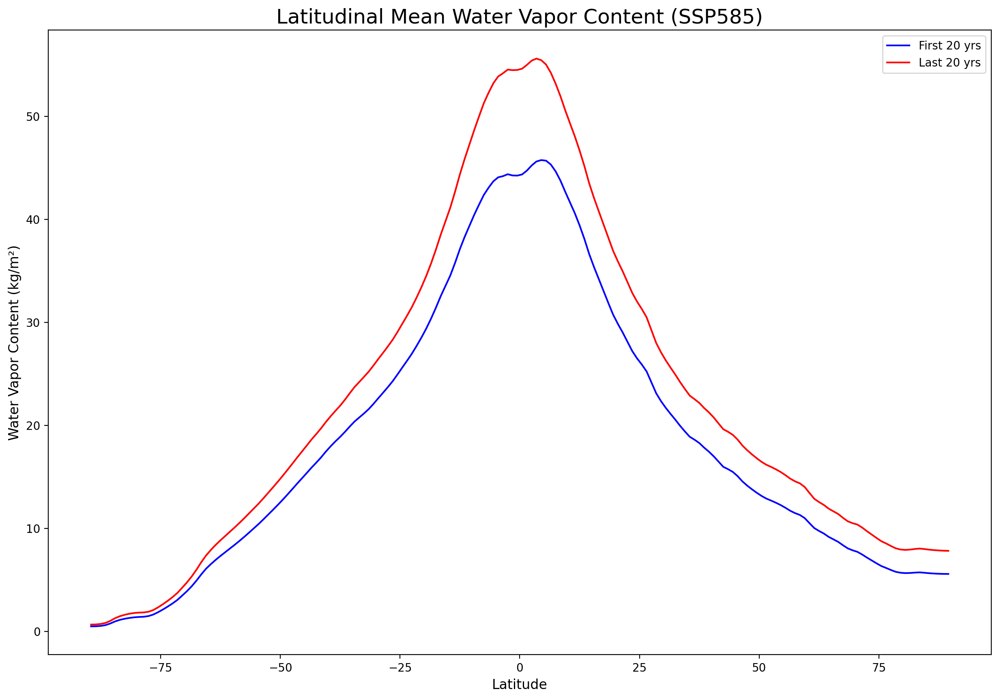

In [167]:
# Establishing figure parameters
fig, ax = plt.subplots(figsize = (15, 10))

# Assigning each dataset to the appropriate axis
# The code below finds the mean water vapor content across global latitude, which can then be plotted on a graph to observe latitudinal changes in vapor content
firstavg_prw585.mean(dim = 'longitude').plot(color = 'blue', label = 'First 20 yrs')
lastavg_prw585.mean(dim = 'longitude').plot(color = 'red', label = 'Last 20 yrs')

# Adding figure titles
ax.set_title('Latitudinal Mean Water Vapor Content (SSP585)', fontsize = 18)

# Adding axis titles/legends
ax.set_ylabel('Water Vapor Content (kg/m²)', fontsize = 12)
ax.set_xlabel('Latitude', fontsize = 12)
ax.legend()

**Figure 22.** Latitudinal cross section of mean water vapor content across two timeframes in the SSP5-85 scenario. The blue line represents the first twenty years (2015-2035) of the dataset, and the red line represents the last twenty years (2080-2100).

The trends seen within this graph match the trends we saw on the global **SSP5-85** average and anomaly maps above, with an overall increase in **water vapor content** being seen in the **SSP5-85** scenario. To restate, the increased levels of warming leads to increase levels of evaporation, which will then lead to an overall increase in **global atmospheric water vapor content**.

To reinforce this concept, we can do one final check by looking at the difference in **global mean water vapor content** between the **SSP1-26** and **SSP5-85** scenarios.

In [168]:
# Placing the weighted cells atop our already created dataset using the .weighted() function
# Then, using the .mean() function over latitude and longitude will produce a dataset showing mean global averages through time
weighted_prw126 = gfdl_esm4_126_wv.weighted(areacell_xarray).mean(['latitude', 'longitude']) 
weighted_prw585 = prw585.weighted(areacell_xarray).mean(['latitude', 'longitude']) 

In [169]:
# Calculating global mean precipitation by using weighted datasets, grouping by year, and getting a mean value for each year
mean_prw126 = weighted_prw126.groupby('time.year').mean(dim = 'time')
mean_prw585 = weighted_prw585.groupby('time.year').mean(dim = 'time')

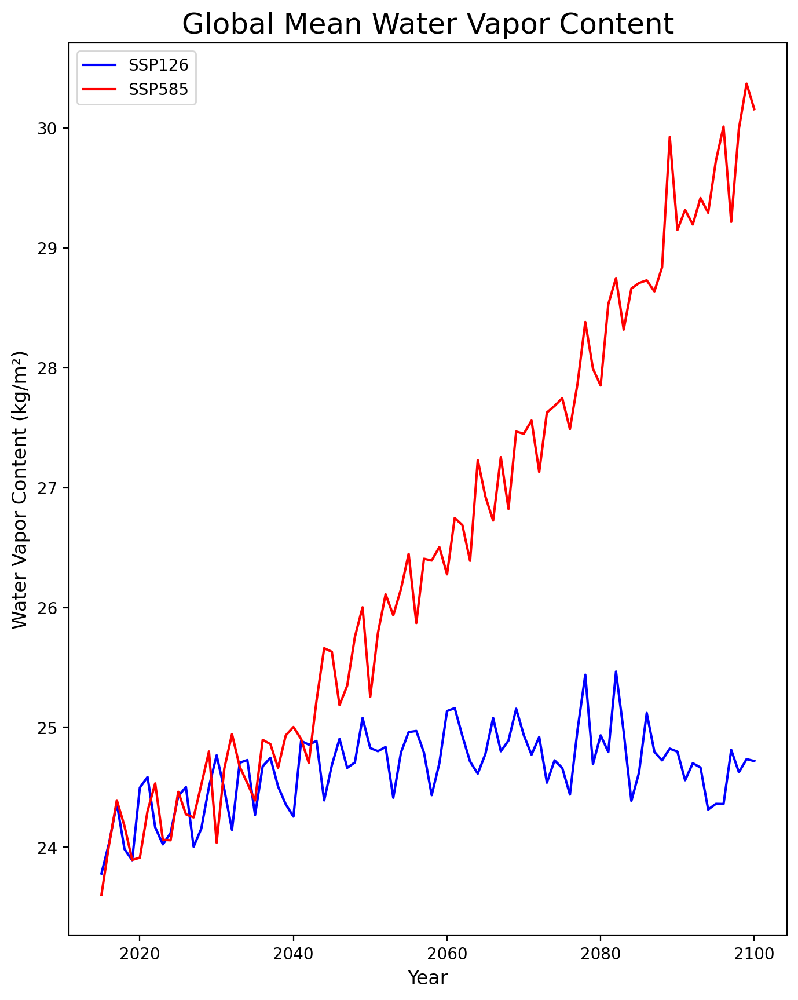

In [170]:
# Establishing figure parameters
fig, ax = plt.subplots(figsize = (8, 10))

# Assigning each dataset to the appropriate axis
mean_prw126.plot(color = 'blue', label = 'SSP126')
mean_prw585.plot(color = 'red', label = 'SSP585')

# Adding figure titles
ax.set_title('Global Mean Water Vapor Content', fontsize = 18)

# Adding axis titles/legends
ax.set_ylabel('Water Vapor Content (kg/m²)', fontsize = 12)
ax.set_xlabel('Year', fontsize = 12)
ax.legend()

**Figure 23.** Global mean water vapor content from 2015-2100. The blue line represents the change in annual water vapor content for the SSP1-26 scenario, and the red line represents the change in annual water vapor content for the SSP5-85 scenario.

As expected, the **water vapor content** in the **SSP5-85** scenario is higher by around 6 km/m², which aligns with the trends seen in all other **water vapor content** figures.

## Conclusions

To conclude this notebook, we wanted to make some closing remarks on the trends seen within each dataset.

When looking at **precipitation**, the **SSP1-26** scenario shows that precipitation trends remain relatively unchanged throughout the century. The Pacific Ocean NE of Australia is the only place that sees any real change in precipitation, with all other areas either slightly increasing or decreasing, but remaining relatively close to zero. In the **SSP5-85** scenario, major increases in precipitation are seen around the equator as well as minor changes near 50N and S, reinforcing the idea that **wet gets wetter**, but dry areas do not appear to get any drier. It is also worth noting, that by 2100, the **SSP5-85** scenario has a noticably larger global mean precipitation than the **SSP1-26** scenario.

The **snowfall flux** in the **SSP1-26** scenario remains relatively unchanged on a global scale, with the latitudinal cross sections of the first and last twenty years overlapping at essentially every latitude. In the **SSP5-85** scenario, an interesting pattern can be observed, showing significant decreases in **snowfall flux** in the lower latitudes of the poles, but higher flux in higher latitudes of the poles. By 2100, global average **snowfall flux** decreases considerably in the **SSP5-85** scenario, being much lower than in the **SSP1-26** scenario.

The **water vapor content** in the **SSP1-26** scenario remains relatively unchanged, a slight increase noted around the equator, but all other areas hovering around an anomaly of zero. The **SSP5-85** scenario shows an entirely different story, with **water vapor content** increasing almost everywhere globally except in Greenland and Antarctica. These trends are reflected in the global mean value for each scenario, as the **SSP5-85** scenario has a much higher mean **water vapor content** value than in the **SSP1-26** scenario.

Salinity levels decreased in the northern hemisphere more than the southern hemisphere, and levels don't substantially increase in SSP12 or in SSP585. However, evaporation is consistent with salinity data because evaporation levels that are high around the equator have higher salt content, and levels that are lower around the northern and southern hemispheres have lower salinity levels.

And finally, to answer the question proposed at the beginning of the notebook: **Does wet get wetter and dry get drier?** From the data analyzed in this notebook, the answer seems to be that **wet does get wetter, but dry does not get drier.** This is particularly noticable in our precipitation datasets, as wet areas did see an additional increase in precipitation, but the dry areas did not see any decrease in overall precipitation levels, even in the **SSP5-85** scenario.

### References

Bolles, Dana. “The Ocean and Climate Change.” NASA, Sept. 2024, science.nasa.gov/earth/explore/the-ocean-and-climate-change/. Accessed 11 Dec. 

2024.Bottinger, Michael, and Dieter Kasang. “The SSP Scenarios.” DKRZ, 2020, www.dkrz.de/en/communication/climate-simulations/cmip6-en/the-ssp-scenarios. Accessed 11 

Dec. 2024.“Global Atmospheric Circulations.” National Oceanic and Atmospheric Administration, U.S. Department of Commerce, 3 Oct. 2023, www.noaa.gov/jetstream/global/global-atmospheric-circulations. Accessed 11 Dec. 2024.

## Author Contributions

**Lucas DeVito:**
- All code/analysis/figure captions for the precipitation datasets
- All code/analysis/figure captions for the snowfall flux datasets
- Code/analysis/figure captions of SSP5-85 scenario for water vapor content, as well as global mean water vapor content graph
- Importing of precipitation datasets
- Importing of snowfall flux datasets
- Importing of SSP5-85 water vapor content dataset
- Conclusions on precipitation, snowfall flux, and water vapor datasets
- Combining draft notebooks into final notebook
- References


**Jacklyn Bihl:**
- All code/analysis/figure captions for the sea surface salinity datasets
- All code/analysis/figure captions for the evaporation datasets
- Code/analysis/figure captions of SSP1-26 scenario for water vapor content
- Importing of sea surface salinity datasets
- Importing of evaporation datasets
- Importing of SSP1-26 water vapor content dataset
- Conclusions on sea surface salinity and evaporation datasets


**Both of us:**
- Introduction section
- Variable explanations
- Blog post